In [69]:
!pip install bokeh jupyter_bokeh

IOStream.flush timed out
IOStream.flush timed out
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 779.7/779.7 kB 2.2 MB/s eta 0:00:00m eta 0:00:010:00:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for jupyter_bokeh: filename=jupyter_bokeh-3.0.5-py3-none-any.whl size=1398357 sha256=dd9222f34aa15ab72f1bcb73839ce5c7bc1e280004160a188e802e655d0f56e4
  Stored in directory: /Users/k.nosorev/Library/Caches/pip/wheels/32/dd/5e/2efab29244857dcd904de473ca7b974c891300299f5243f326
Successfully built jupyter_bokeh


In [70]:
from pathlib import Path
from reader import show_uproot_tree, readInfoFromRoot, genChunkFromRoot
from geometry import get_plain_and_transform
from skspatial.objects import Plane, Point, Vector
from tqdm import tqdm
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from bokeh.plotting import figure, show
from bokeh.io import output_notebook

dataset_dir = Path('dataset')
root_file = "farichsim_pi-pi-_45-360deg_1200.0k_ideal_2020-12-24_rndm.root"
root_path = dataset_dir / root_file
output_notebook()

DeprecationWarning: The `source` parameter emit a  deprecation warning since IPython 8.0, it had no effects for a long time and will  be removed in future versions.

In [67]:
output_notebook()

DeprecationWarning: The `source` parameter emit a  deprecation warning since IPython 8.0, it had no effects for a long time and will  be removed in future versions.

In [2]:
target_columns = ["x_c", "y_c", "t_c"]
chunk = next(genChunkFromRoot(root_path, needNoise=False, verbose=False))
df = chunk.loc[(10, 0):(11, -1)][target_columns].sort_values(by="t_c")

nevents: 1200000
zdis: 1.0
nlayers: 4
array_size: 26.68
array_gap: 1.0
pixel_size: 3.16
pixel_gap: 0.2
pixel_numx: 8
nxarrays: 30
nyarrays: 30
distance: 200.0
trg_window_ns: 20.0
W: 35.0
n_mean: 1.0453999999999999
n_max: 1.05
Processing ROOT file dataset/farichsim_pi-pi-_45-360deg_1200.0k_ideal_2020-12-24_rndm.root with 1200000 simulated events...

  Processing next chunk...
    1992 entries with 63072 hits to process


In [3]:
df[["x_c", "y_c", "t_c"]]= df[["x_c", "y_c", "t_c"]].round(2)

In [4]:
df

x_c         y_c   t_c
entry subentry                              
10    34         77.599998   25.600000  0.77
      28         43.200001 -108.639999  0.78
      26         46.560001 -105.279999  0.78
      29         46.560001 -108.639999  0.78
      25         46.560001 -112.800003  0.79
      27         53.279999 -108.639999  0.79
      21         18.879999 -122.879997  0.79
      32         57.439999 -112.800003  0.79
      33         67.519997 -108.639999  0.80
      31         64.160004 -112.800003  0.80
      19          8.800000 -129.600006  0.80
      20          5.440000 -136.320007  0.81
      39         85.120003 -116.160004  0.83
      47        126.239998  -67.519997  0.84
      42         88.480003 -122.879997  0.84
      41         91.839996 -122.879997  0.85
      40         91.839996 -126.239998  0.85
      7         -64.160004   91.839996  0.86
      15        -12.160000 -174.880005  0.89
      35         57.439999   12.160000  0.89
      46        112.800003 -140.479996  0.90
      24         39.840000 -178.240005  0.90
      5         -70.879997  -95.199997  0.90
      45        116.160004 -147.199997  0.92
      16        -15.520000 -191.679993  0.93
      13        -15.520000 -199.199997  0.95
      12        -15.520000 -205.919998  0.97
      14        -15.520000 -212.639999  0.98
      52        143.839996 -188.320007  1.04
      11        -12.160000 -247.039993  1.07
      10        -12.160000 -257.920013  1.10
      9          -5.440000 -261.279999  1.11
      2        -219.360001  -39.840000  1.11
      6         -60.799999    8.800000  1.12
      8         -36.480000 -268.000000  1.14
      51        153.919998 -230.240005  1.14
      18          8.800000 -299.040009  1.21
      17         12.160000 -302.399994  1.22
      22         18.879999  -95.199997  1.28
      50        157.279999 -292.320007  1.30
      1        -254.559998  147.199997  1.31
      3         -98.559998 -299.040009  1.31
      54        168.160004 -299.040009  1.33
      4         -60.799999 -334.239990  1.33
      23         46.560001 -344.320007  1.35
      48        147.199997 -323.359985  1.37
      49        164.000000 -320.000000  1.37
      56        251.199997 -243.679993  1.38
      38         98.559998 -357.760010  1.42
      30         70.879997 -365.279999  1.42
      53        147.199997    2.080000  1.46
      37         88.480003 -378.720001  1.46
      44        132.960007 -365.279999  1.46
      36        105.279999 -382.079987  1.49
      0        -285.600006 -261.279999  1.54
      55        236.960007 -274.720001  1.61
      43         91.839996   -2.080000  2.25

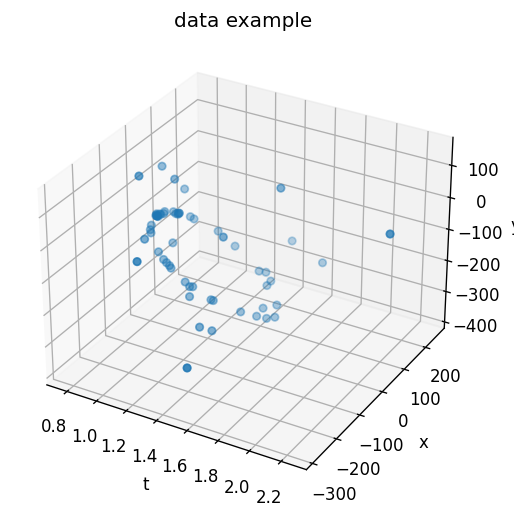

In [55]:
plt.figure(figsize=(8, 5), dpi=120)
ax = plt.axes(projection='3d')
ax.scatter3D(df['t_c'], df['x_c'], df['y_c'] )
ax.set_xlabel('t')
ax.set_ylabel('x')
ax.set_zlabel('y');
ax.set_title('data example');
plt.savefig('example.png')

In [36]:
!pip install plotly

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.3/15.3 MB 8.5 MB/s eta 0:00:00m eta 0:00:010:00:01m


In [40]:
import plotly.express as px
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)




In [44]:
# df = px.data.iris()
fig = px.scatter_3d(df, x='t_c', y='x_c', z='y_c')
fig.show();


<AxesSubplot: xlabel='x_c', ylabel='y_c'>

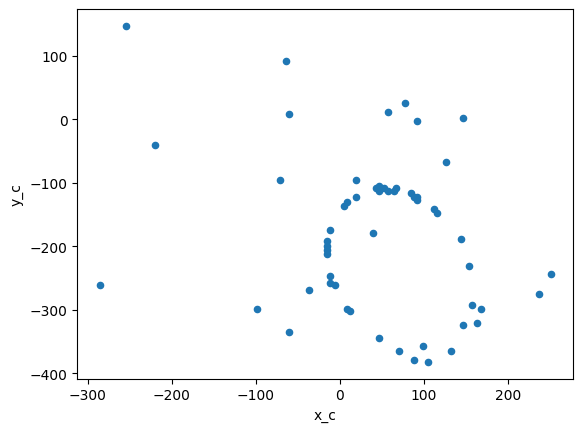

In [5]:
df.plot.scatter("x_c", "y_c")

In [6]:
df['points'] = df.apply(lambda p: Point([p.x_c, p.y_c, p.t_c]), axis=1)

In [7]:
import importlib
import geometry

geometry = importlib.reload(geometry)


In [8]:
def get_x_y_from_points(points, transf):
    xs =[]
    ys =[]
    for p in points:
        x, y, _ = transf(p) 
        xs.append(x)
        ys.append(y)
    return np.array(xs),np.array(ys)

In [9]:
df['points'] = df.apply(lambda x: Point([x.x_c, x.y_c, x.t_c]), axis=1)

In [10]:
def ellipse(A, B, C, D, E):
    return np.vectorize(lambda x,y: A*x*x+B*x*y+C*y*y+D*x+E*y-1)

  2%|█▉                                                                                                             | 1/57 [00:12<11:45, 12.60s/it]

-44.08669521668643 102.13728981134602


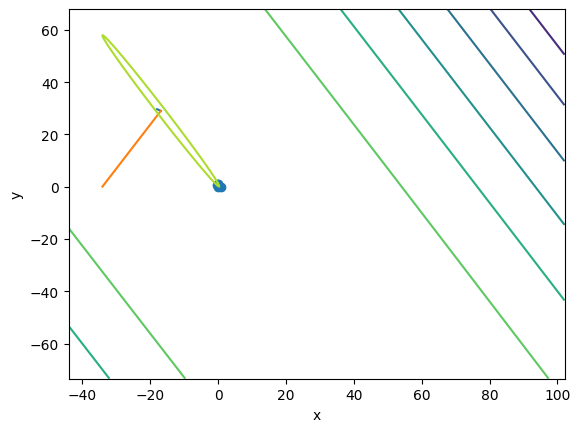

  5%|█████▊                                                                                                         | 3/57 [00:40<12:03, 13.40s/it]

-187.9086875570862 185.89100973003485


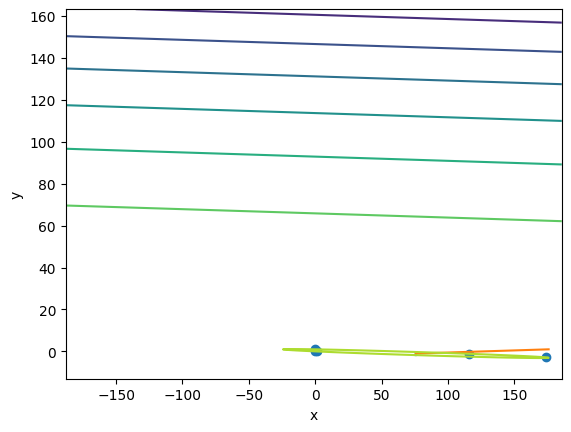

-89.92171222360422 89.06705765301811


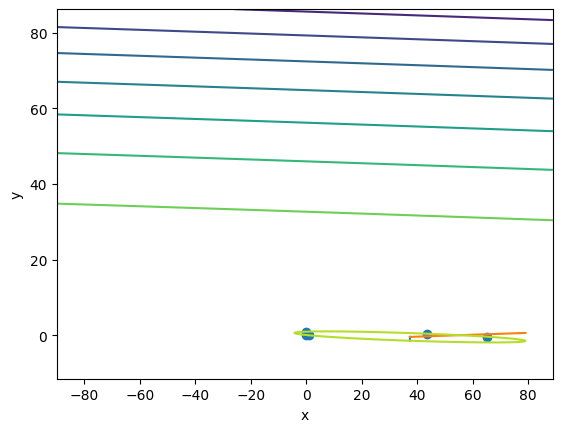

-11.045845509272795 18.483733512760626


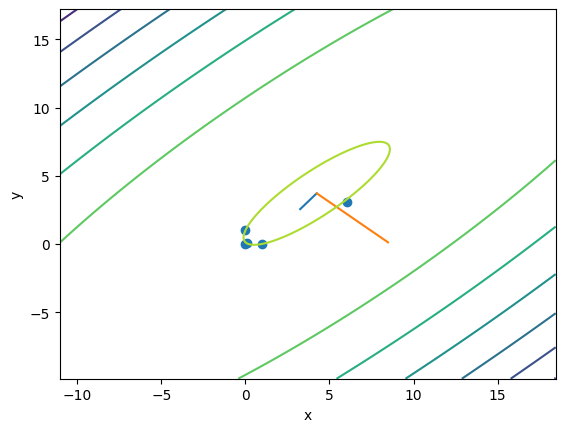

-13.05100429856653 15.232306026172385


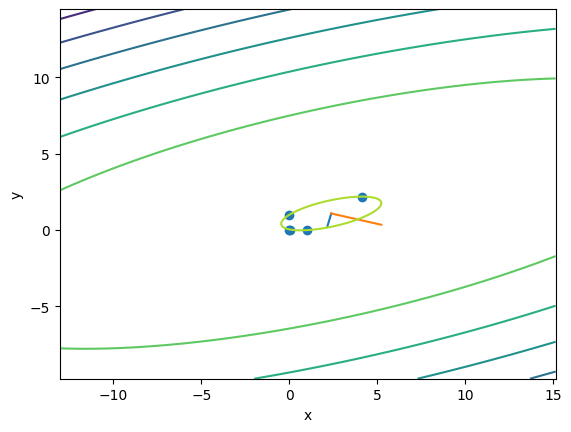

-19.91452489019354 21.683955223003522


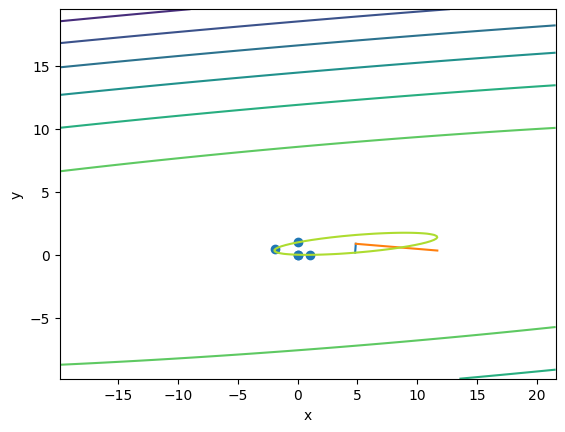

-10.98827426986617 11.999190801839879


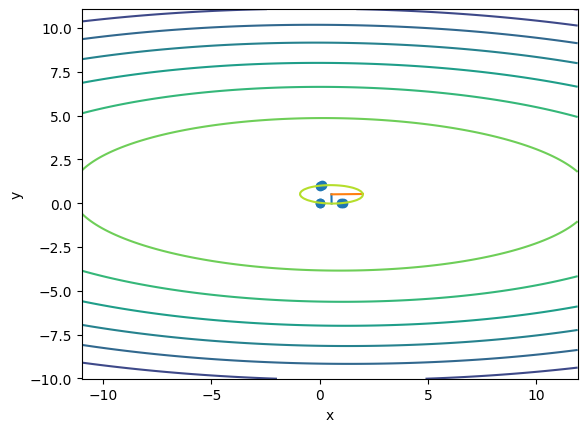

-10.956380023030082 11.956379639758408


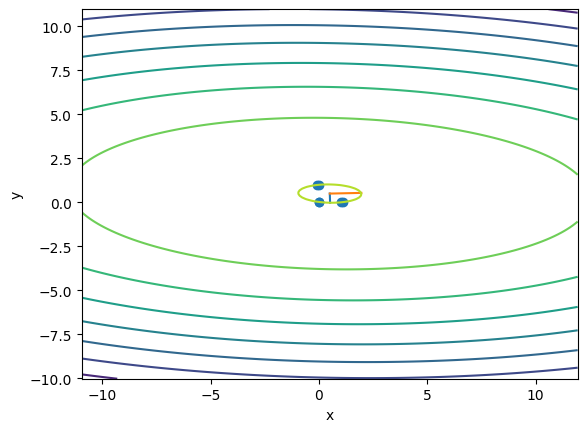

-10.834079517880273 11.834079079319737


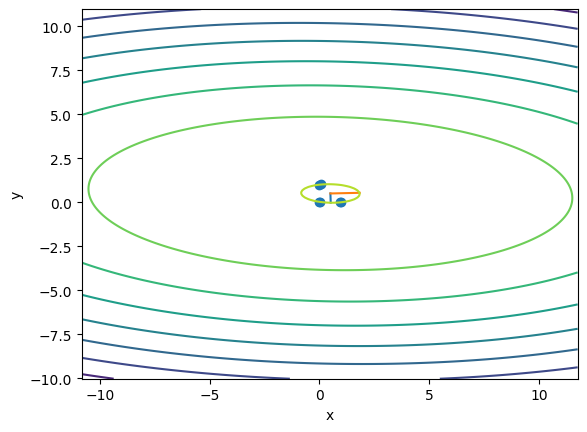

-10.806265697494307 11.796348939776008


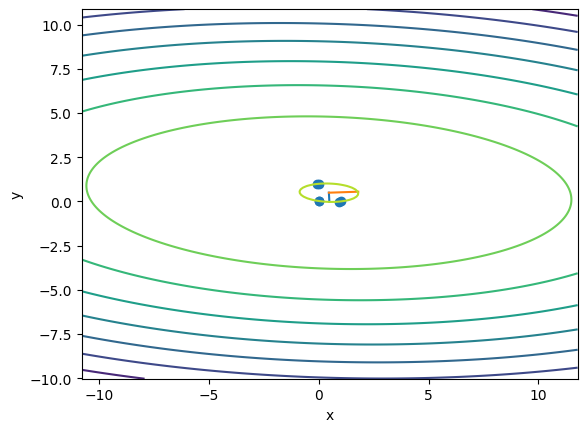

-9.38506835550535 14.634350339619136


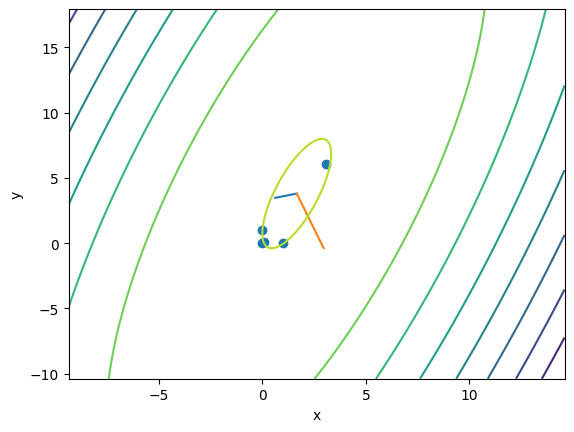

-10.021729527838636 11.68864312565173


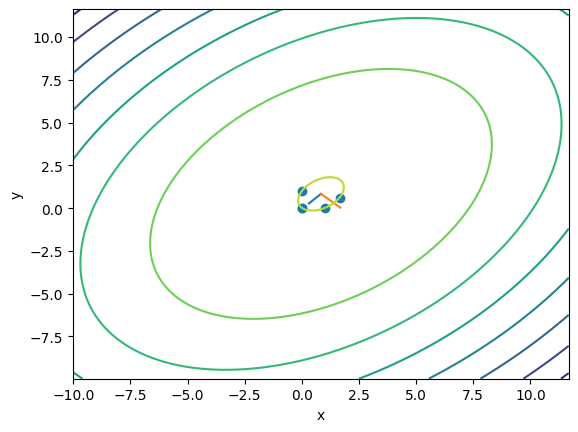

-43.240440763631575 31.36063571997683


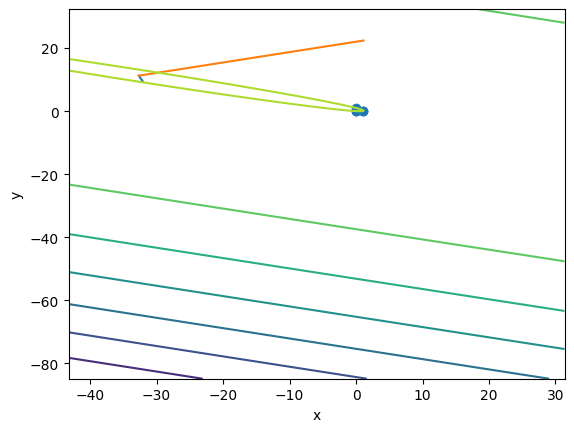

-10.255862754884973 11.094116006996247


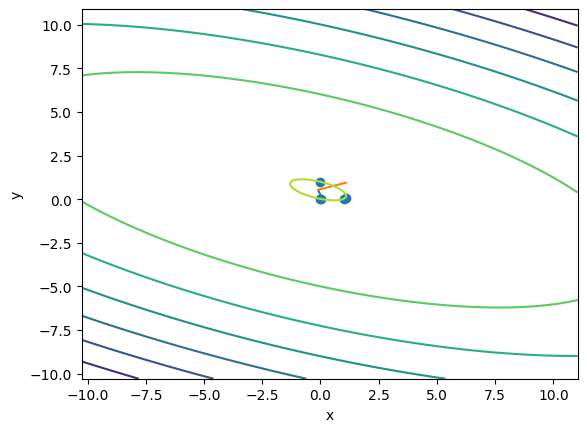

-9.453646847324707 14.626664312162042


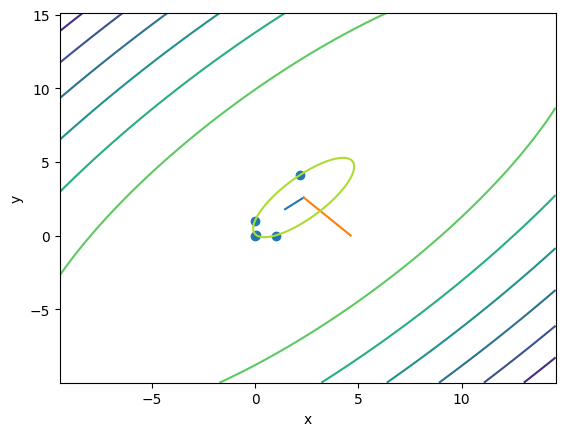

-11.45573627005055 11.273181081119784


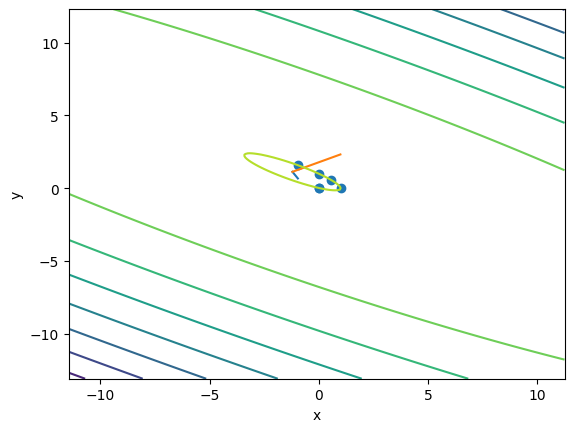

-10.288911578709186 11.156602901699825


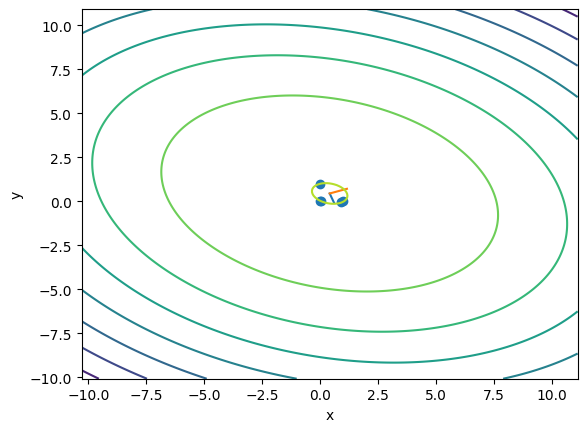

-10.546734567547741 11.471433063504758


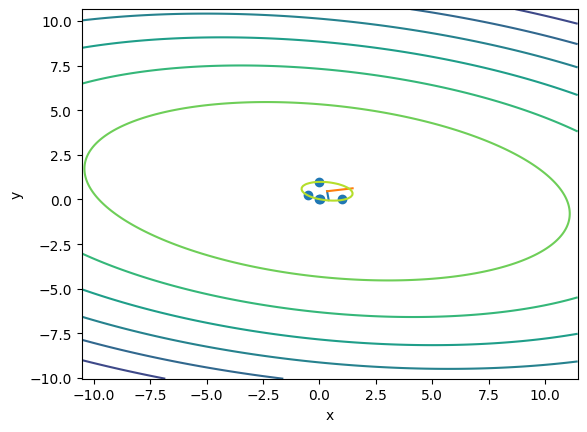

-10.72380825745187 11.024992042083072


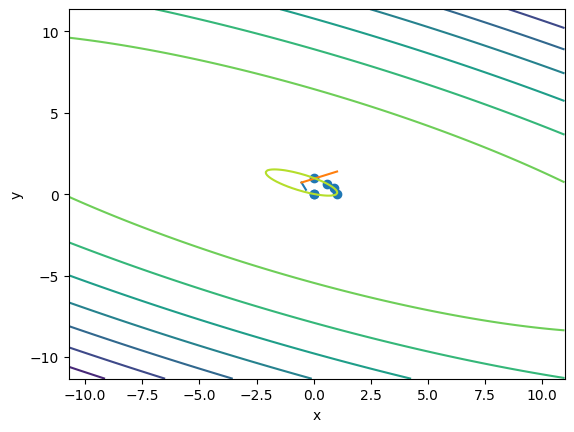

-10.881935739600305 12.213239831899106


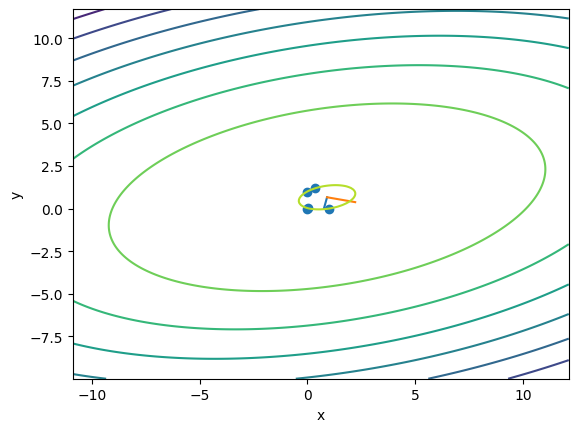

-10.420133421168144 11.397697492422129


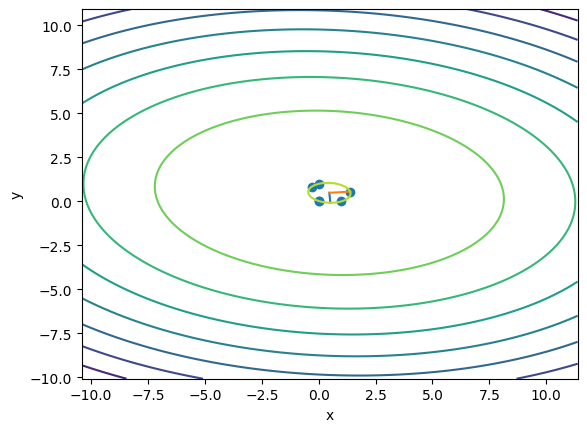

-12.146495581327624 11.111278589882131


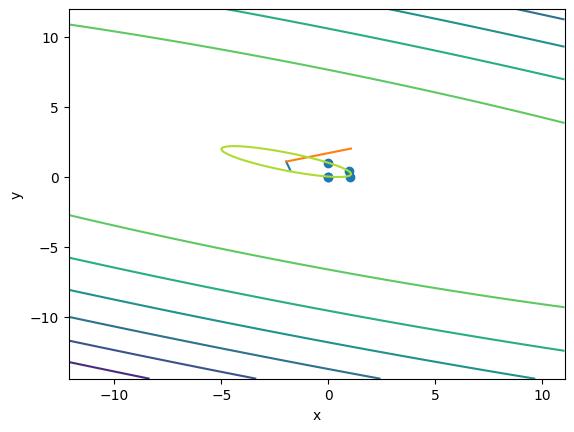

-10.22530215290361 11.138693359547796


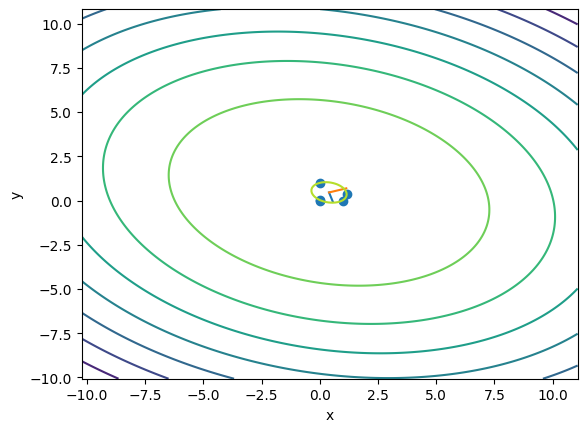

-10.183450203234285 11.000203582484483


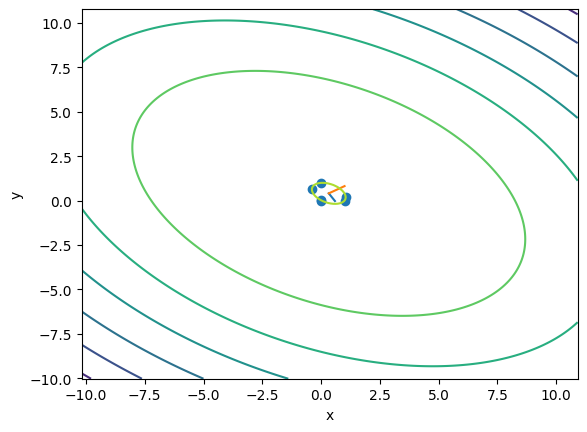

-10.113855360210387 10.821787521933


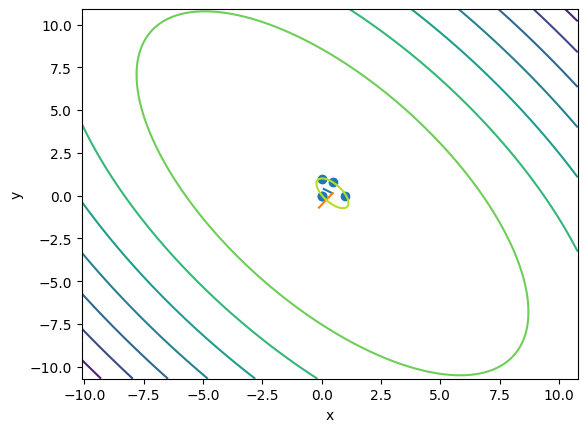

-9.990532741185522 11.014628166857035


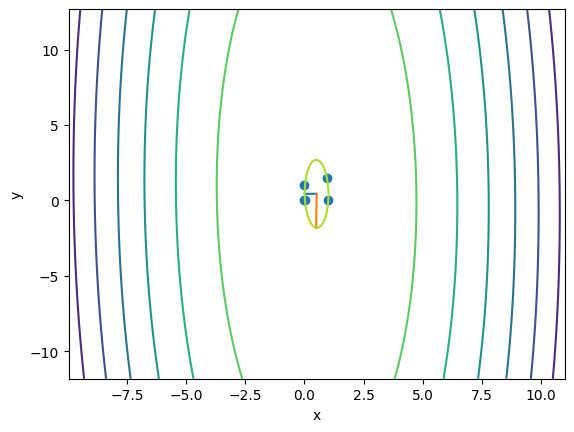

-9.779955784662198 11.671022073016527


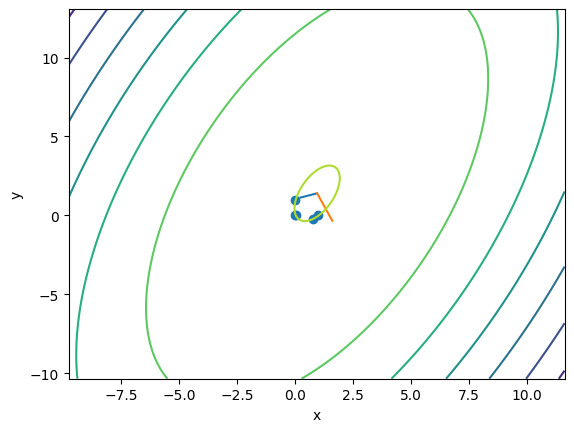

-43.50360843306191 1052.6362622410525


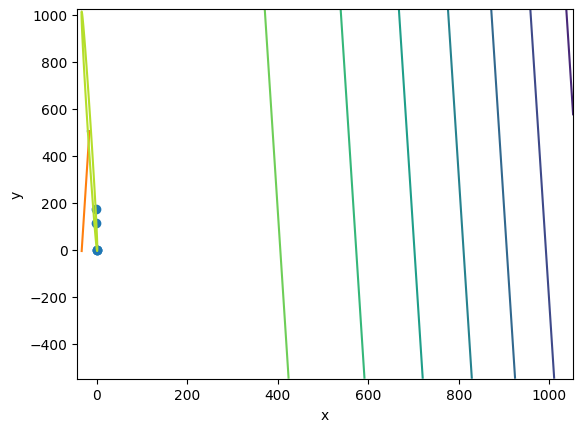

-10.02118209721396 11.032098629187018


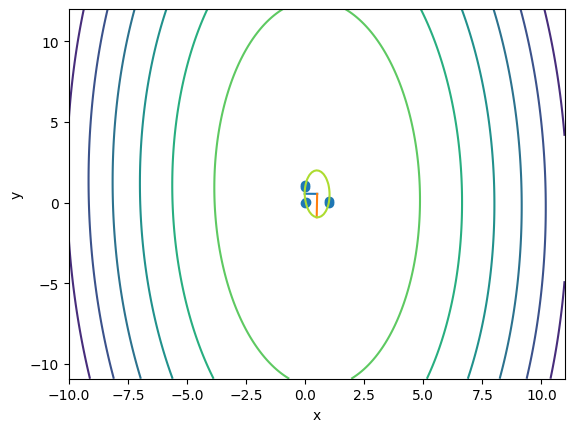

-10.026354531886629 11.02635409332629


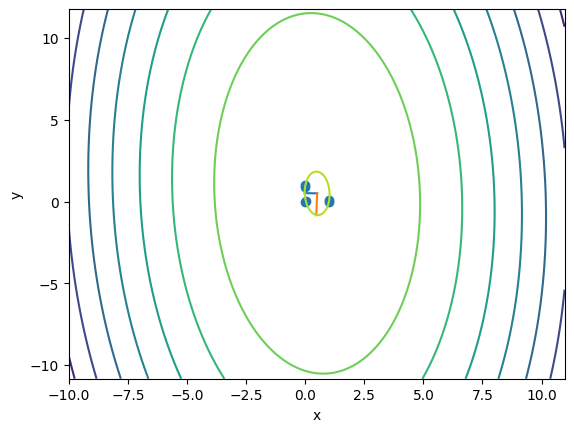

-10.01990851817071 11.019908134899206


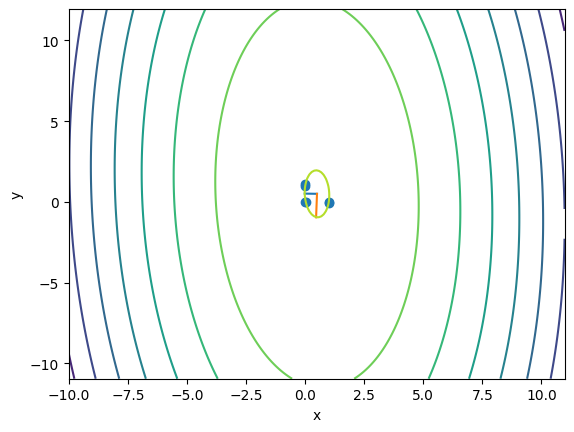

-10.024354320510223 11.0144375627921


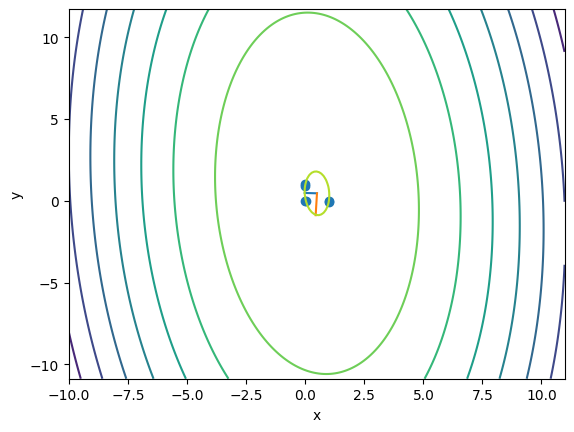

-10.07417200020069 11.051736071454693


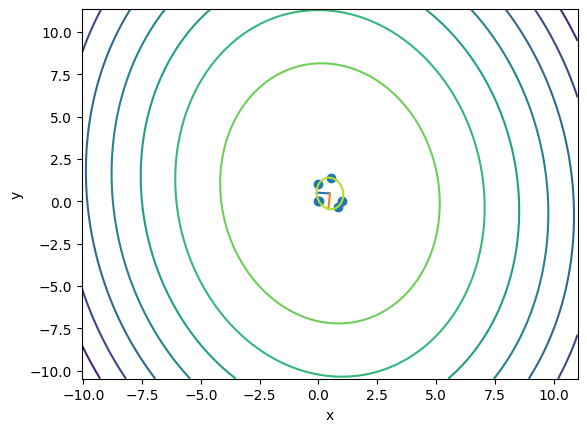

-10.258021990693644 10.929564562024149


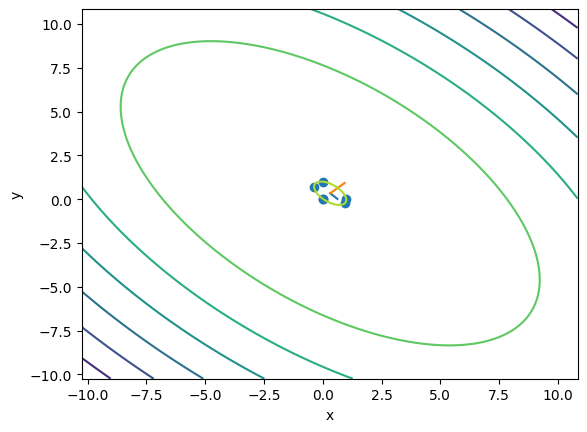

-10.844862070238706 11.132734936385864


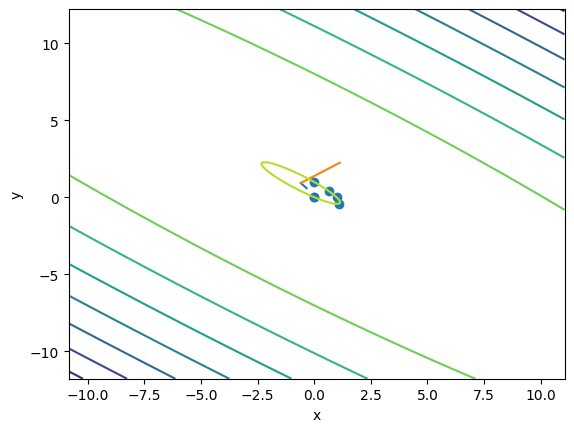

-9.806920649762361 13.926433894541876


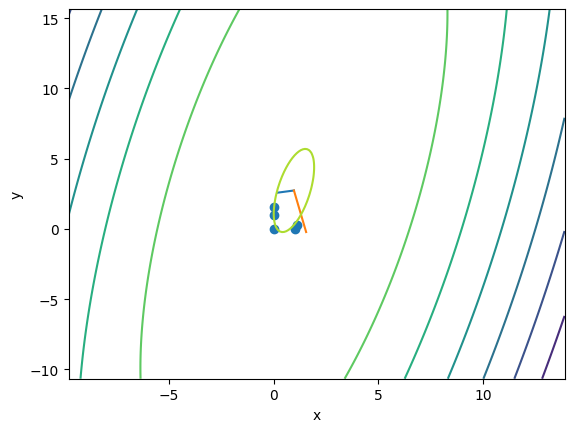

-16.625157656699905 18.759927404151767


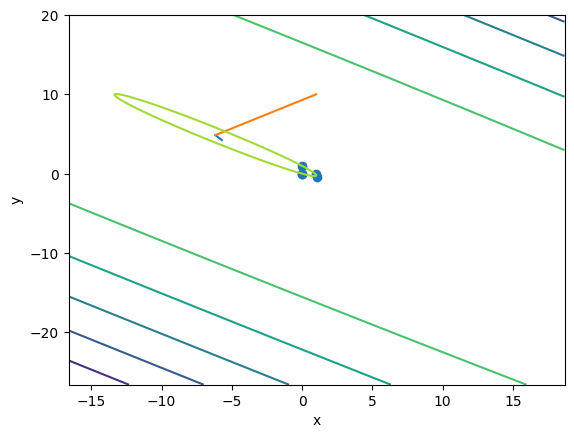

-10.636500847048167 12.019559580085744


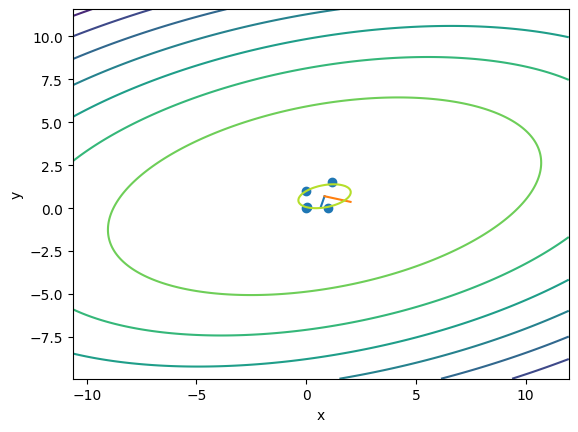

-9.849792043707499 11.440775732511582


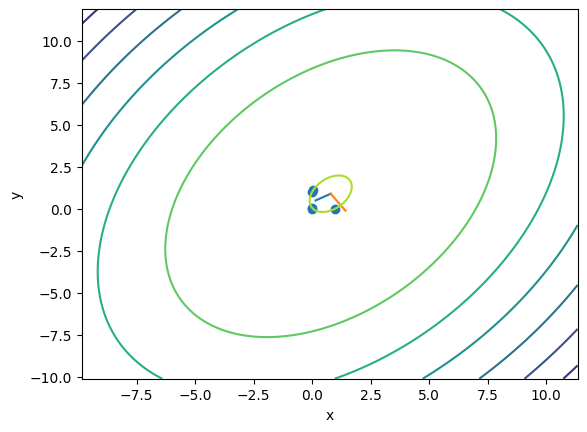

-12.043595450394267 11.100375278688874


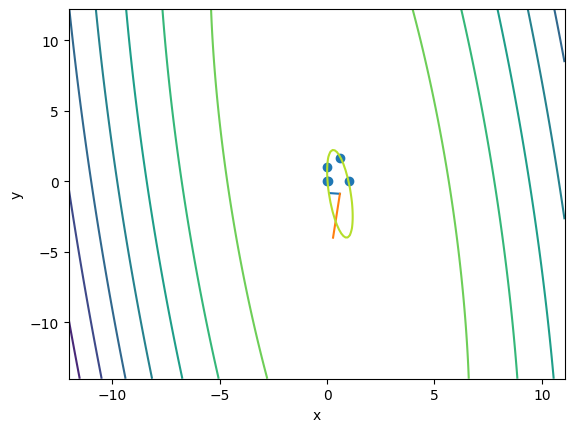

-12.351812471597876 11.585296781451454


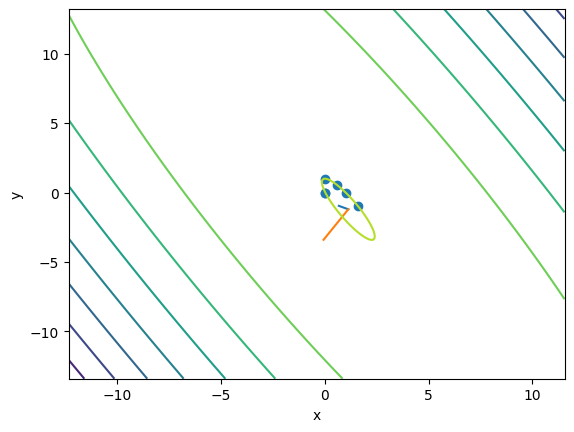

-11.146406804172155 11.716399568666631


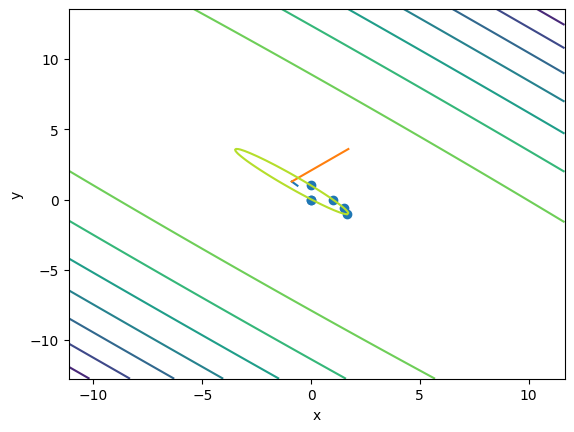

-10.023421218163238 10.840174597413382


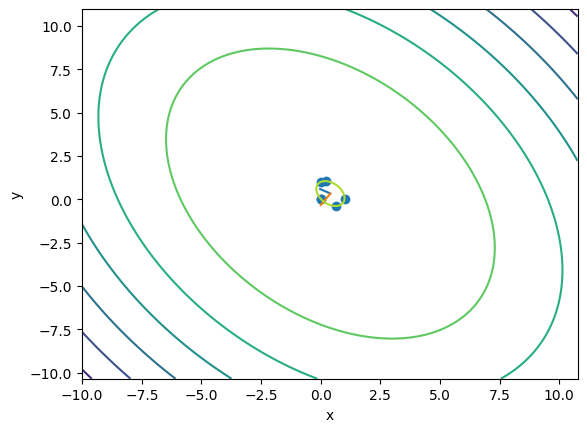

-15.15538692332235 11.206309017985866


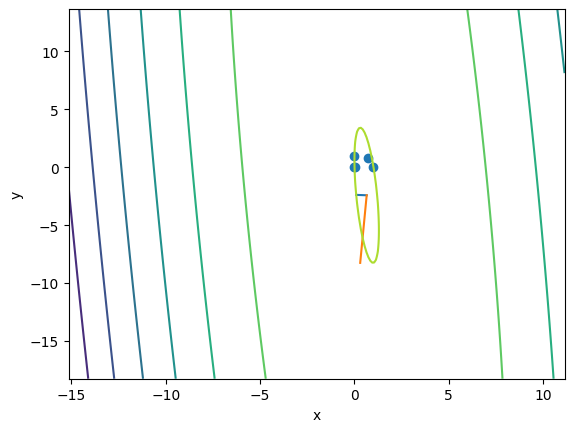

-10.251603302351555 10.880690010038737


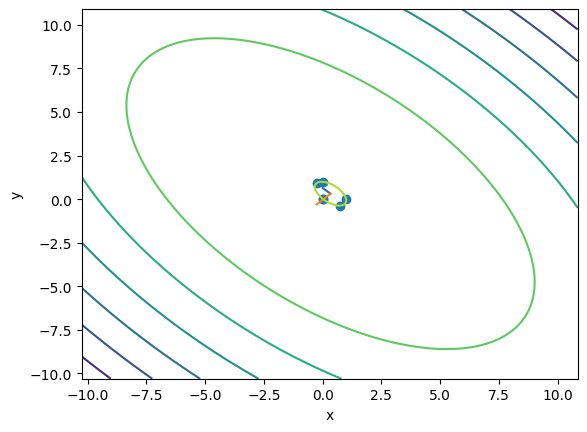

-16.77944416689826 11.992002181058734


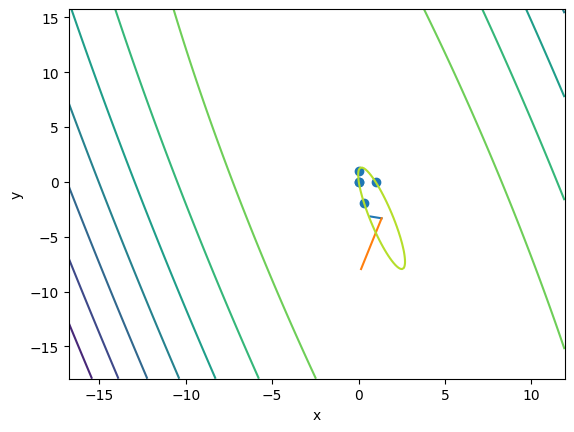

-9.853814702403705 17.9383254345626


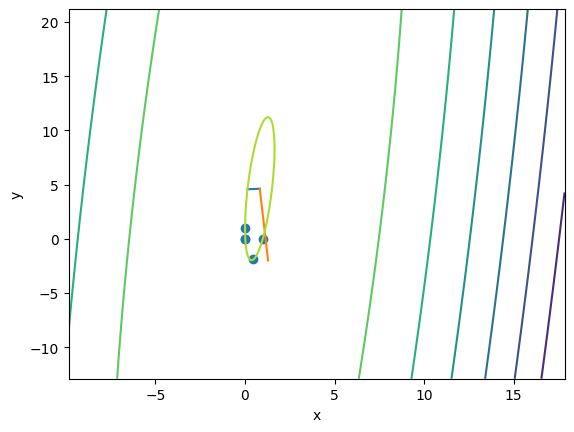

-10.735410773785544 11.111761088773697


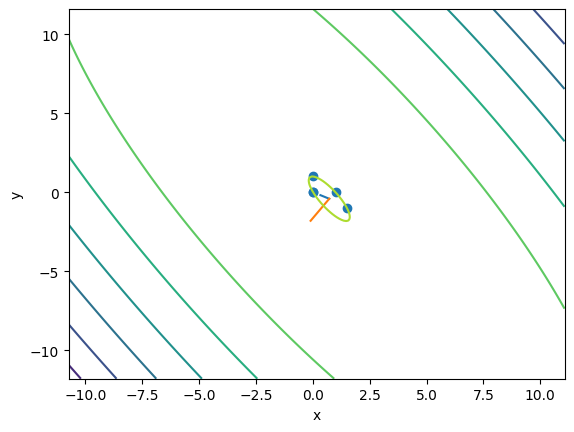

-10.258730302514937 10.92804267090764


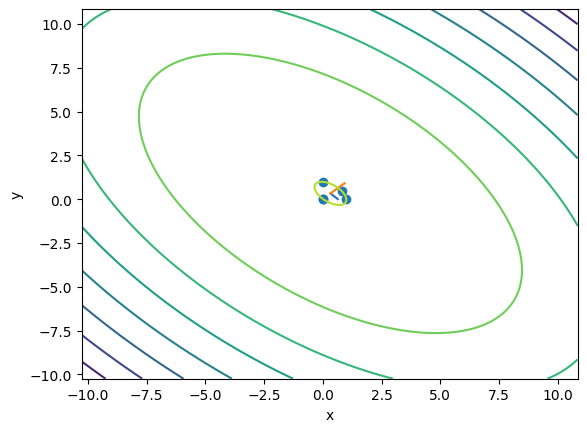

-10.289399935837928 10.860090290568742


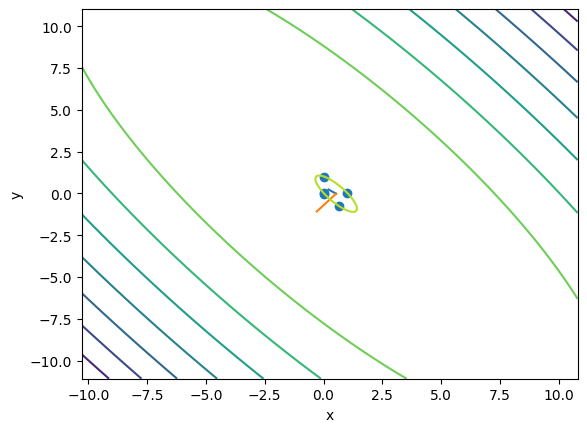

-11.099768497453642 11.159813114643983


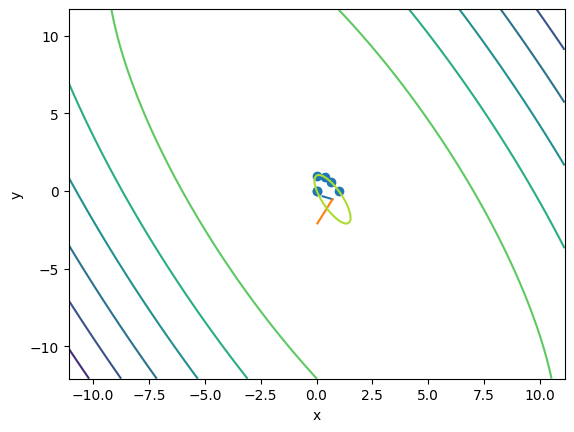

-10.792009365904443 11.265716059501287


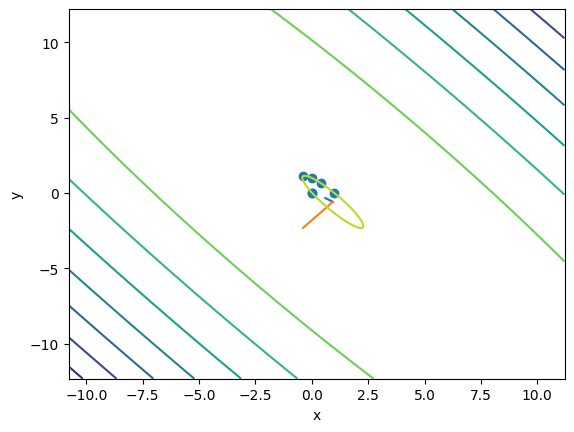

-11.038755603832817 11.570715988888274


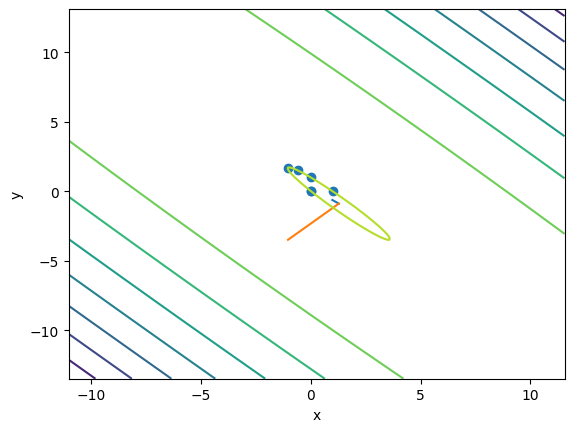

  7%|███████▋                                                                                                     | 4/57 [04:02<1:17:40, 87.93s/it]

-11.736419223781729 16.299593990927455


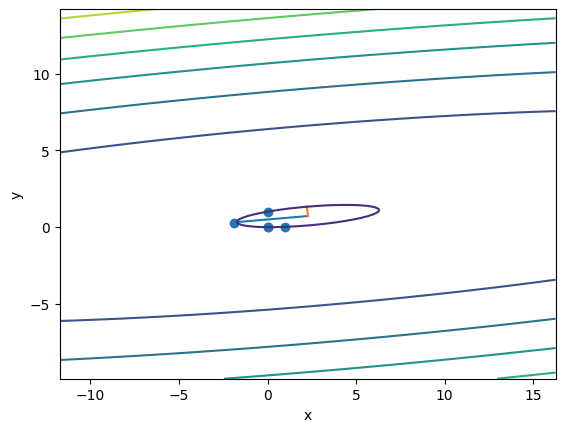

-10.470947754985433 15.072288209850637


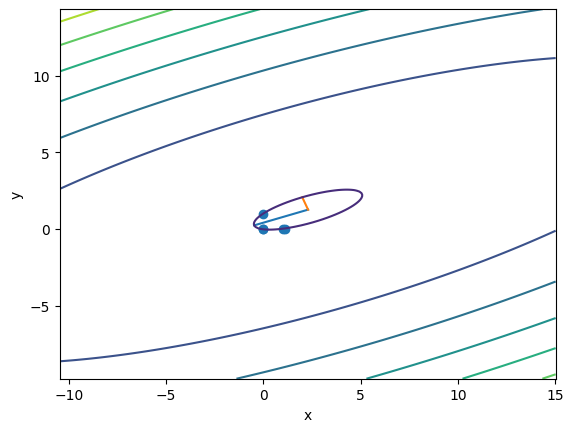

-11.072435586382936 12.164353160710348


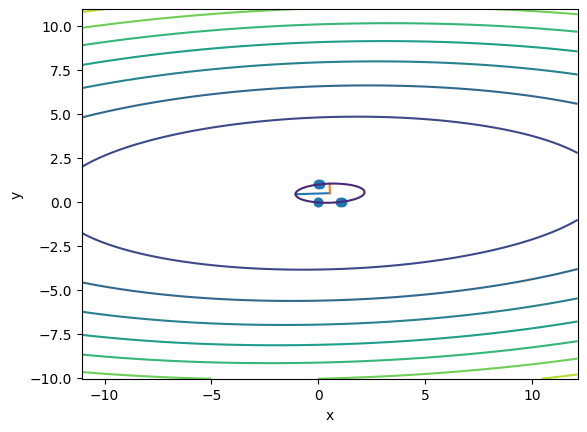

-11.114365103561259 12.114360699979073


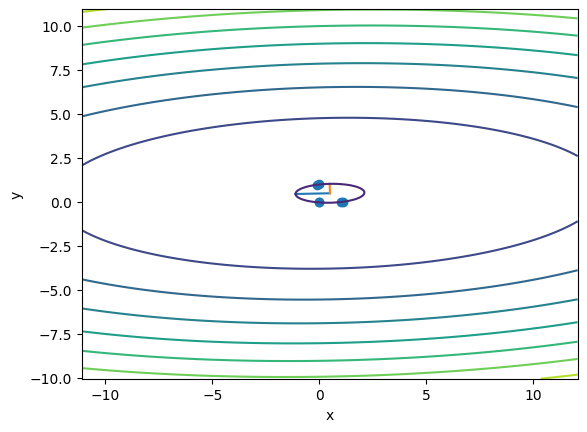

-13.32999660619615 12.12419344451773


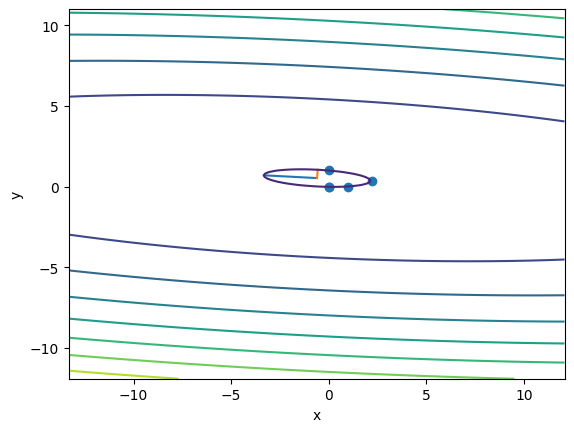

-10.982199282428896 11.982195275599388


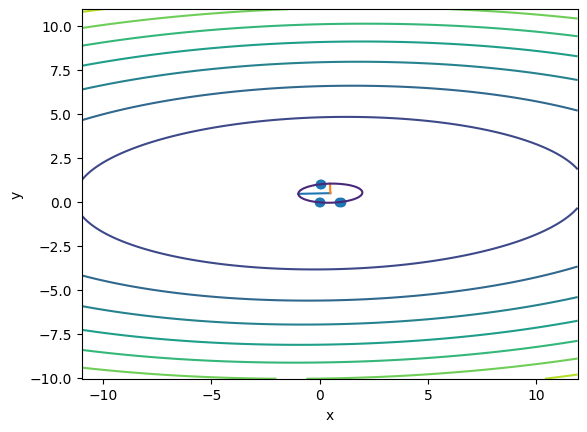

-11.021698092570153 11.938505870867203


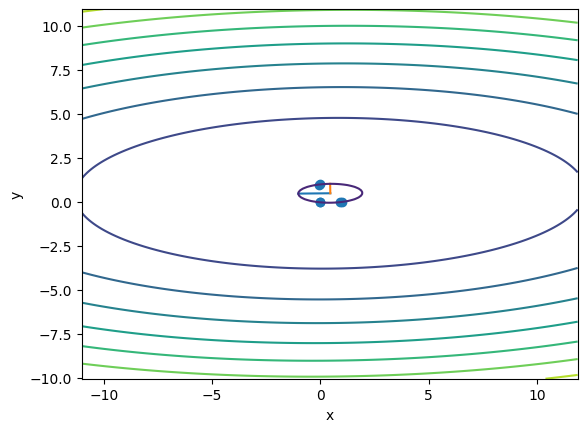

-11.09302669325173 11.172418751185422


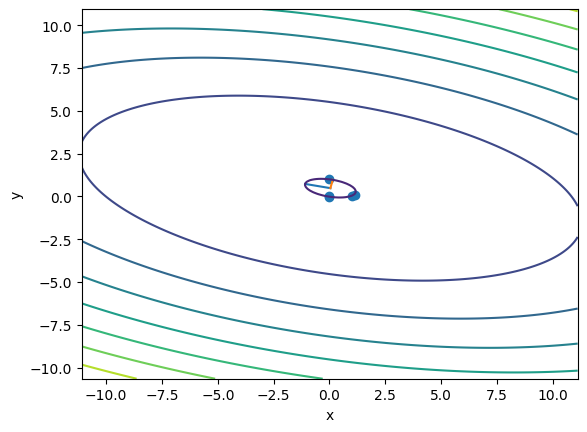

-9.697063220136254 16.074434695208936


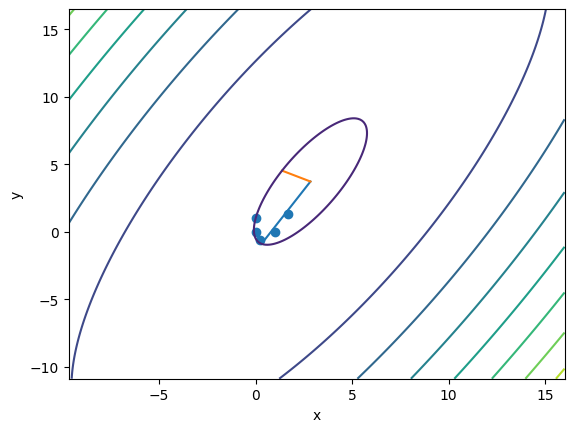

-15.15111267342972 13.014641613637888


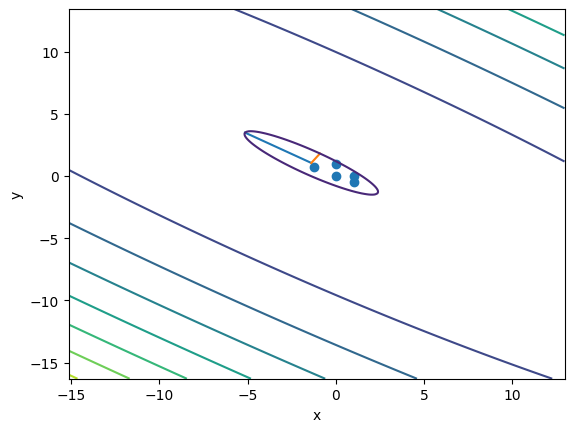

-13.530094388425272 13.268321975444834


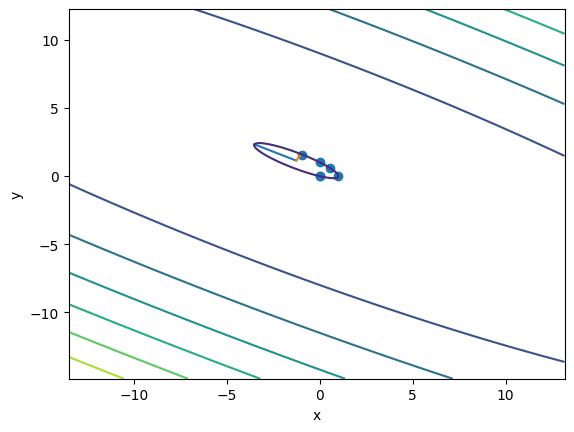

-10.488401361409187 10.913580853762246


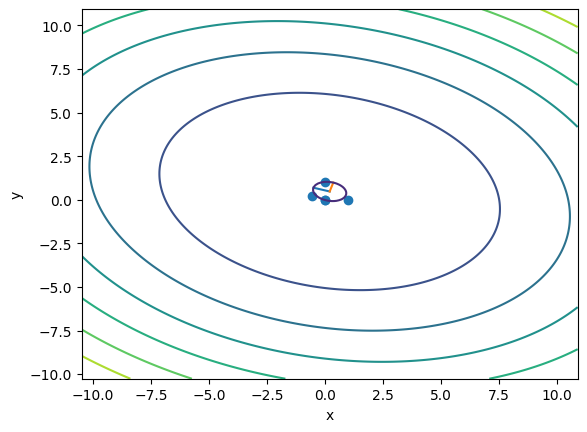

-12.214597621631171 11.832995491035504


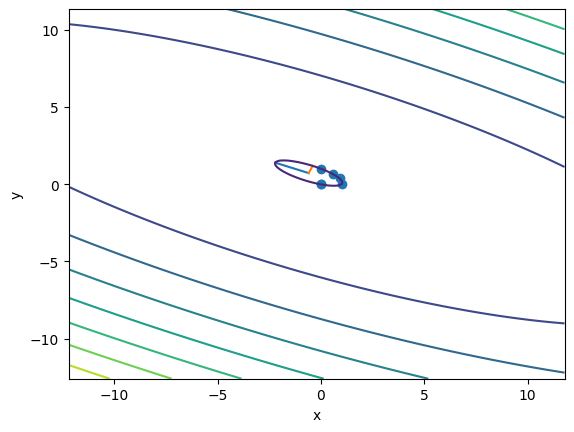

-10.099503490597762 11.104721136084294


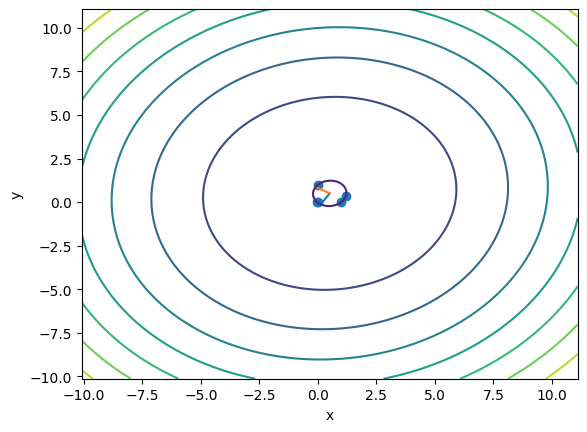

-10.354645630722061 11.003422137189043


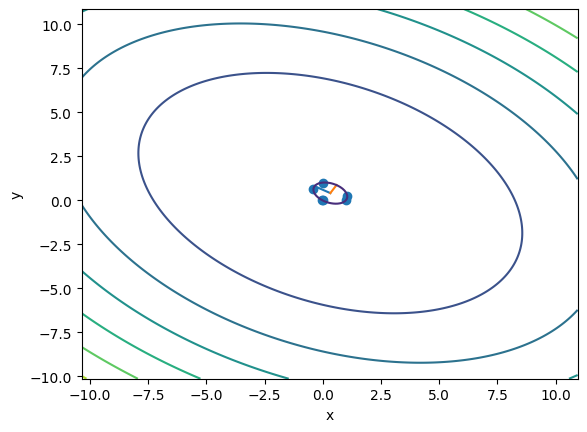

-10.613382436570559 10.718781230267117


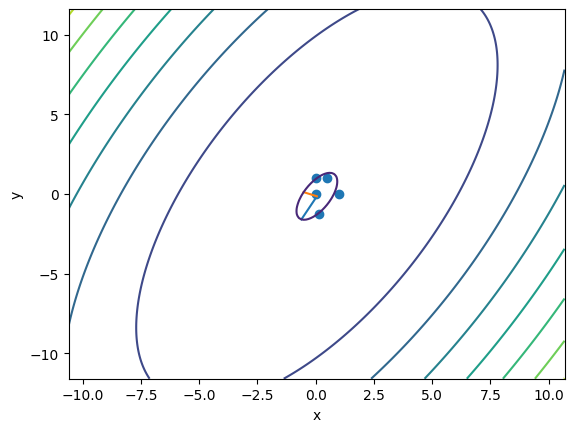

-10.503663410292782 10.667781254242568


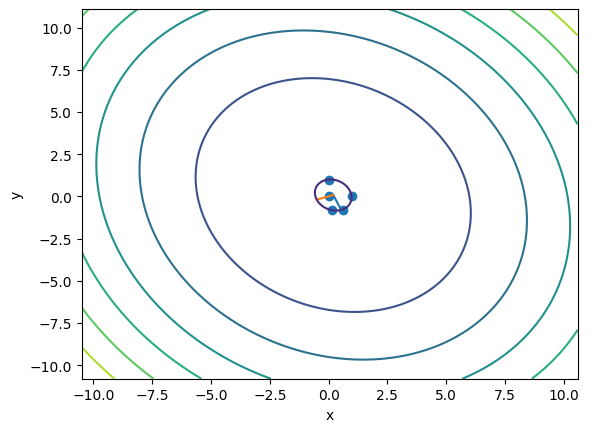

-10.053259851213713 11.33737385270365


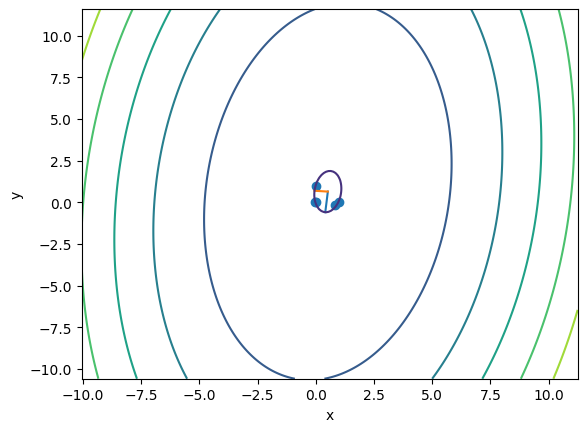

-10.036112236809114 11.12802981113495


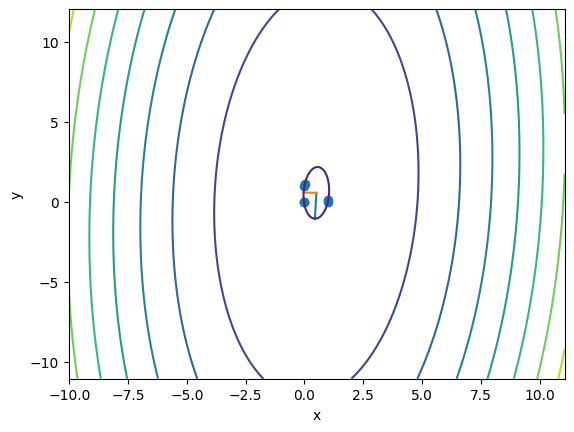

-10.042997270149412 11.042993263321959


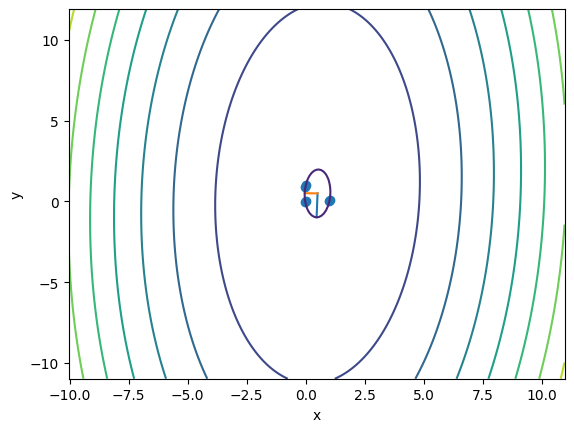

-10.234379154922744 11.058414125495728


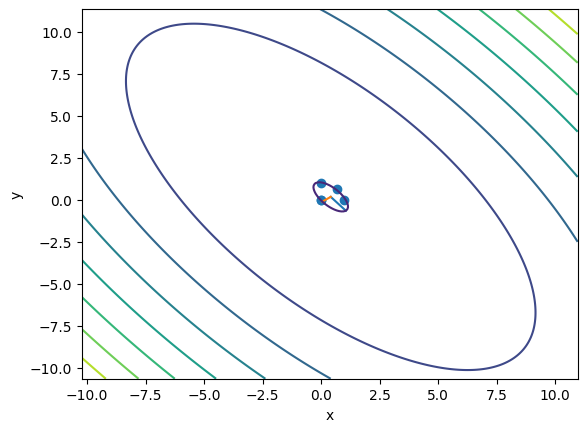

-10.037383321756366 11.037378918175392


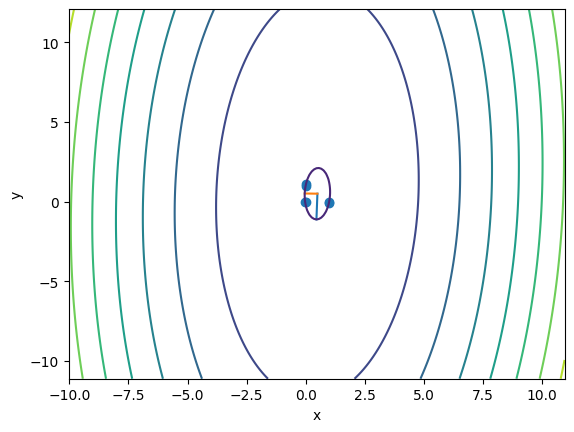

-10.043530811019703 10.960338589318678


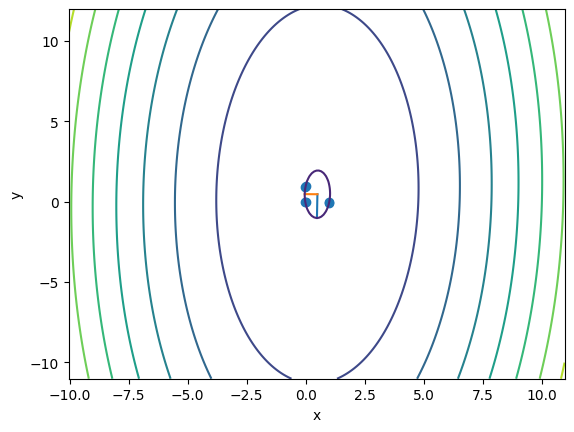

-10.30578469936384 10.922284398696315


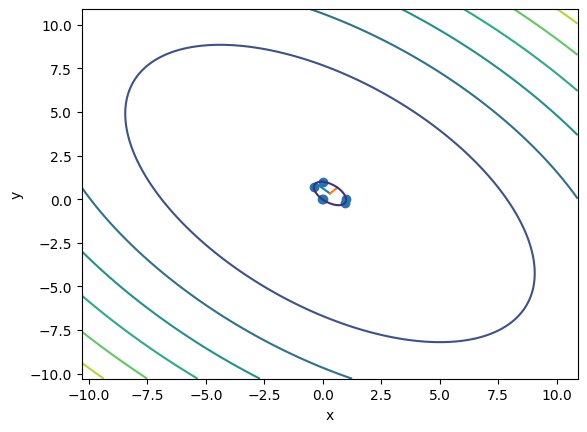

-12.445040359453367 12.31243312547192


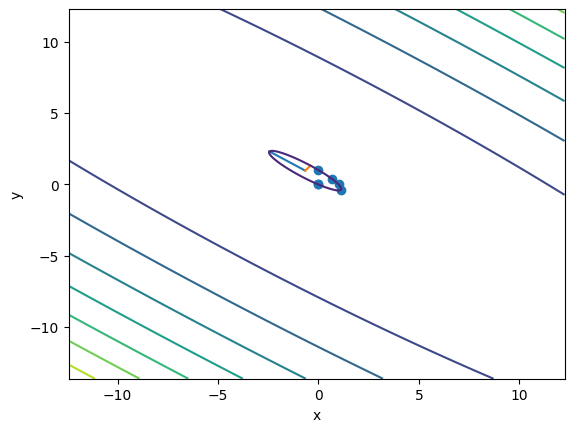

-10.168010732095475 11.619040476744999


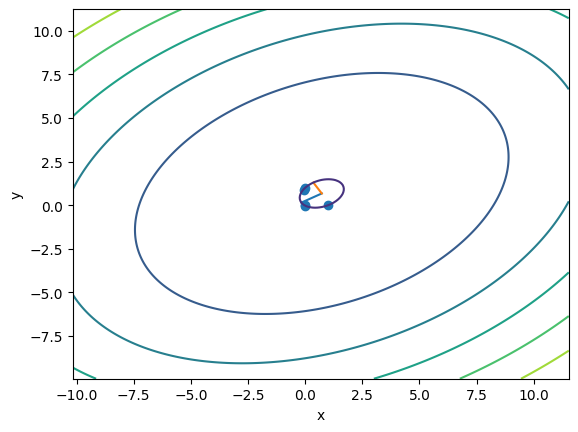

-9.976238254208218 13.340123291803486


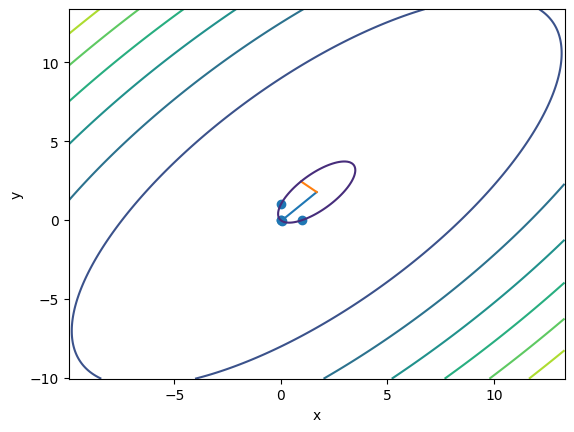

-13.18751708981229 12.321953400234358


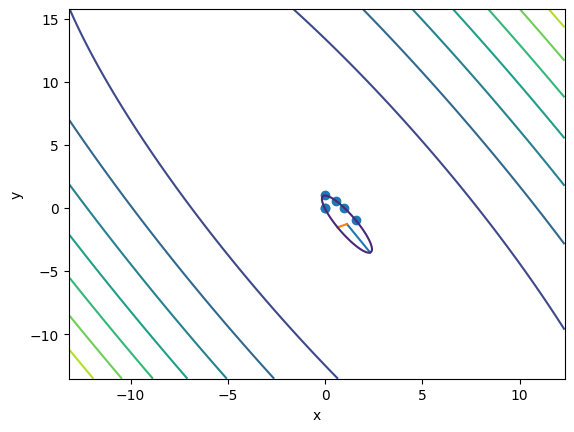

-12.128451151828656 11.683667752045428


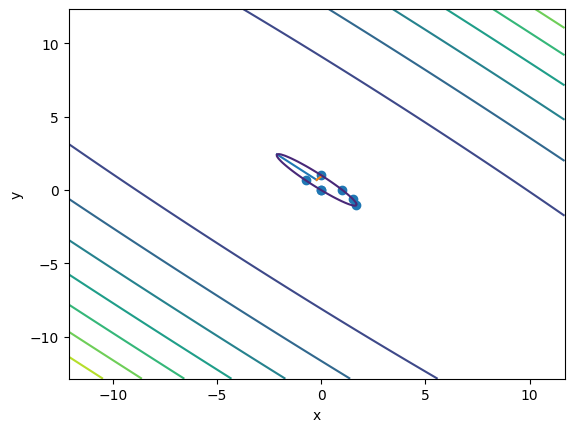

-10.073619353691274 10.839269483016944


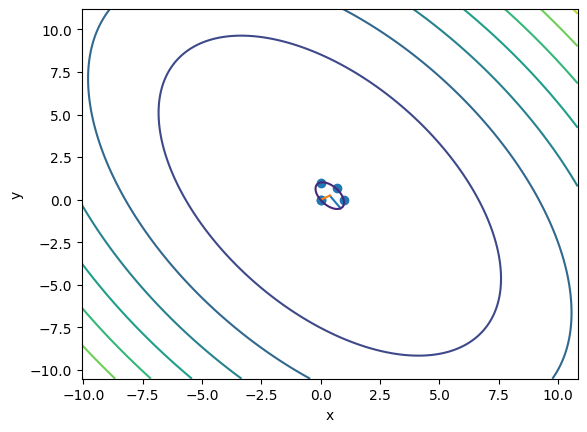

-10.056978301069833 10.795046274376908


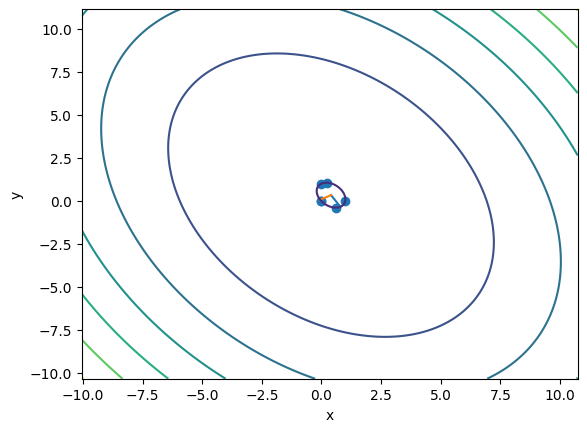

-10.077353213283365 11.017474228888608


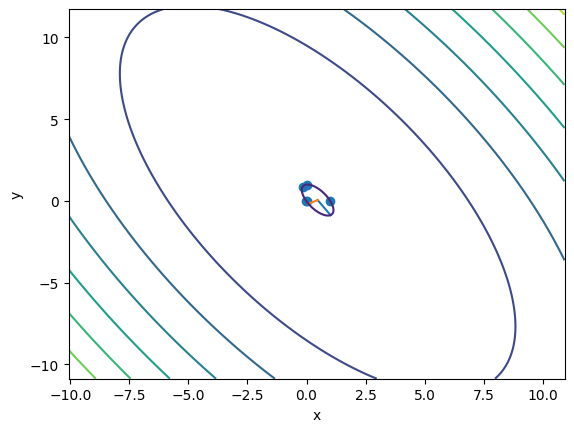

-10.504289339798149 10.938645434200092


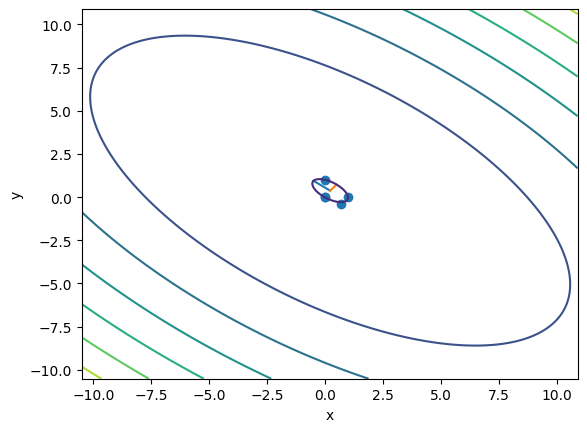

-10.256668702599018 10.913671869935671


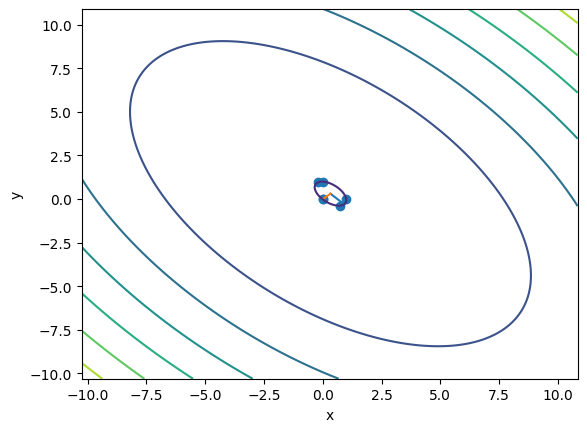

-13.0400128370013 11.31464993083564


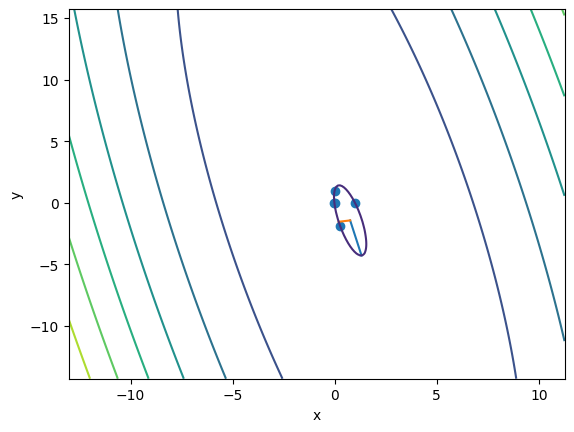

-10.106763360317665 10.863213251789572


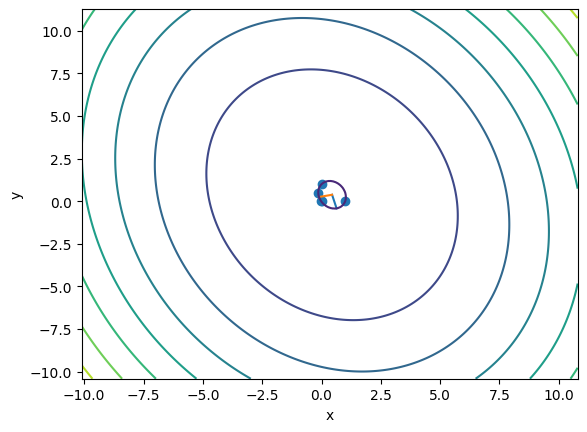

-10.142063587301744 10.8650351487001


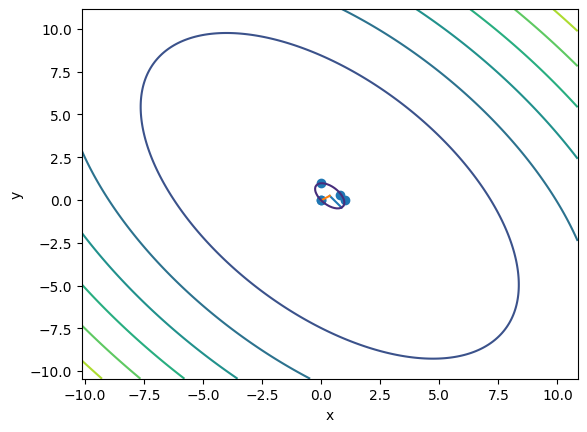

-10.060770071699398 11.079903464778035


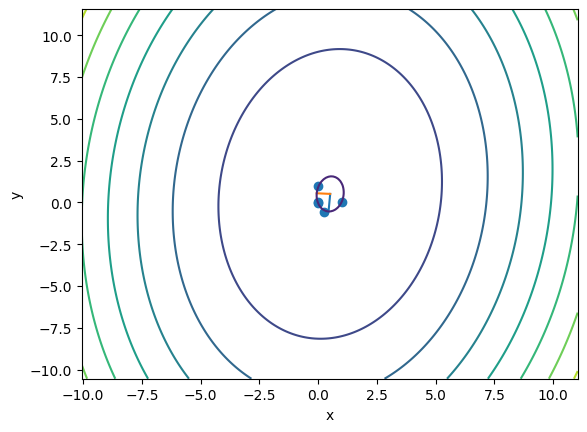

-11.324452263103385 11.184727504059557


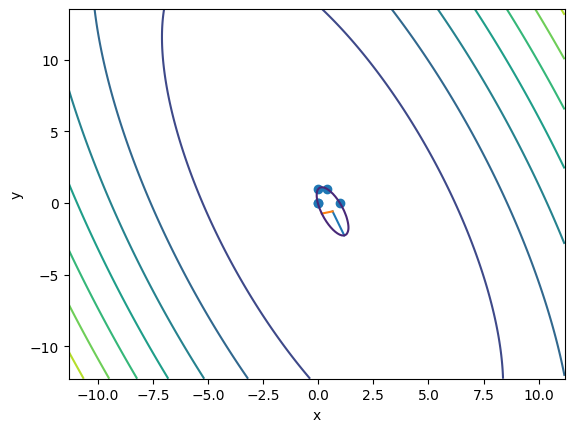

-12.35487535582271 11.739066396966754


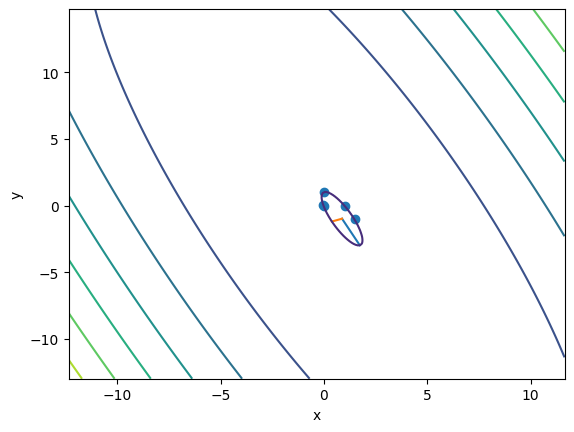

-10.074452057300476 10.833936649062718


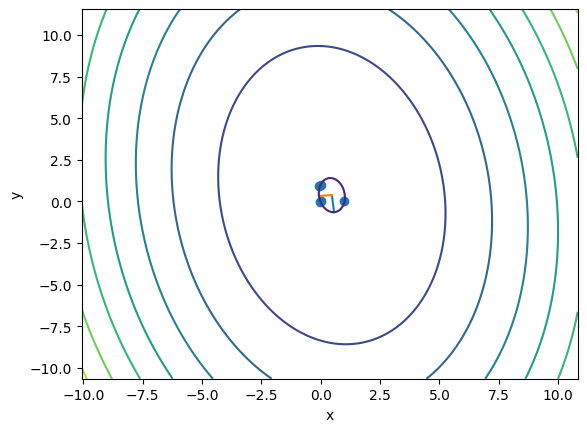

-10.095965927778469 10.901701144950144


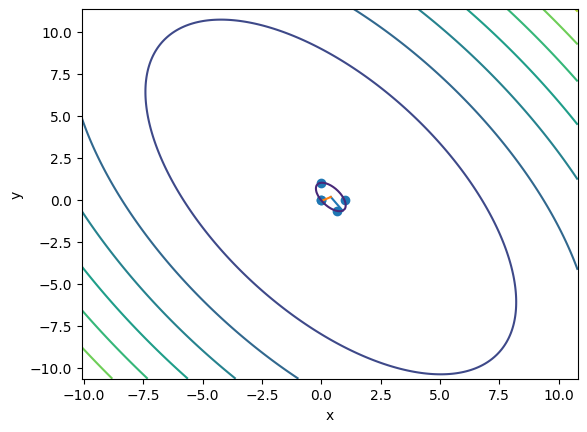

-11.437962674647114 11.391761181072074


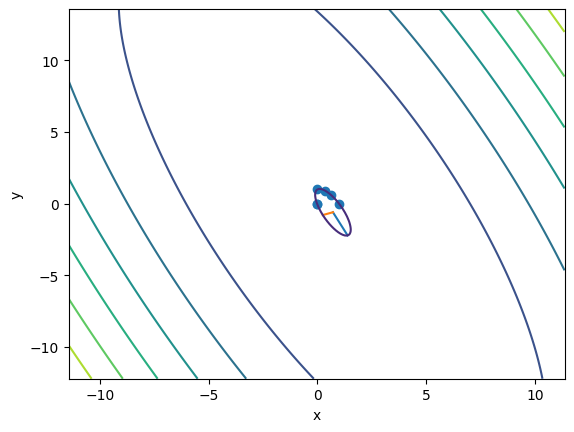

-11.924369369925593 12.306965407159119


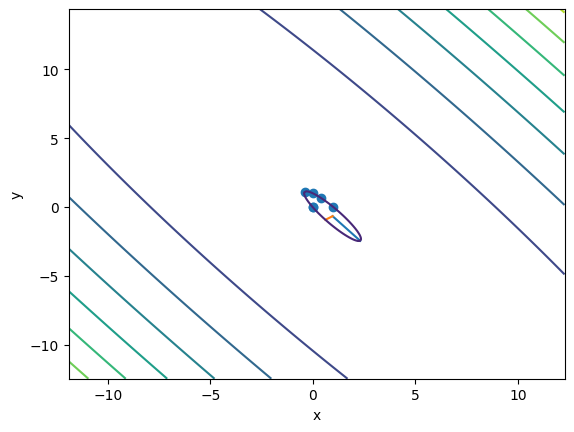

-11.056462695778212 12.426971161620724


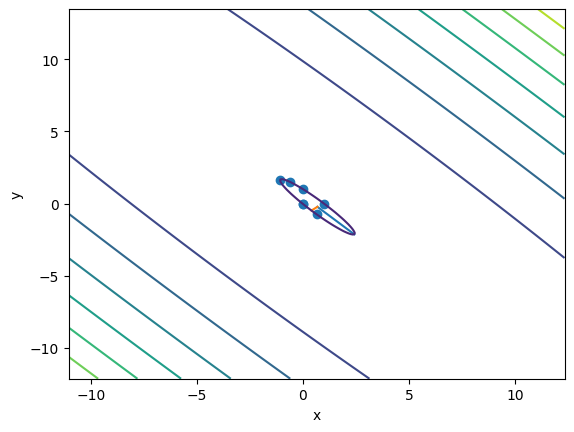

 11%|███████████▋                                                                                                   | 6/57 [04:47<42:02, 49.47s/it]

-10.632308004205786 10.351725571253857


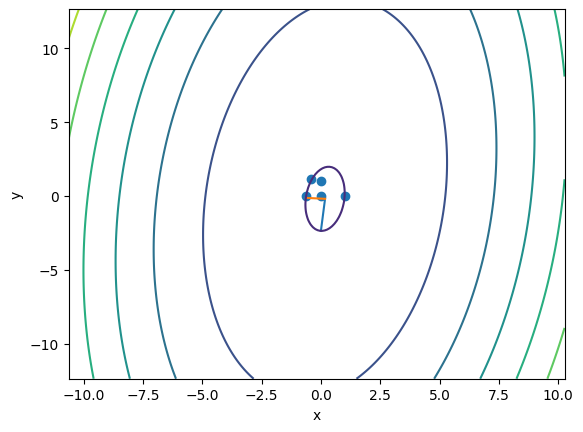

-18.00062368340424 11.296598553950023


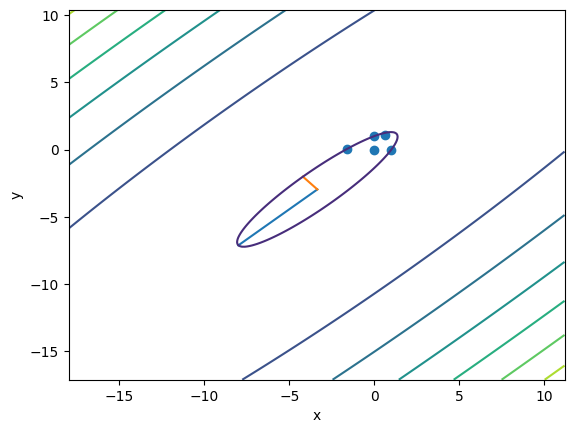

-11.097815472039619 10.846415136078745


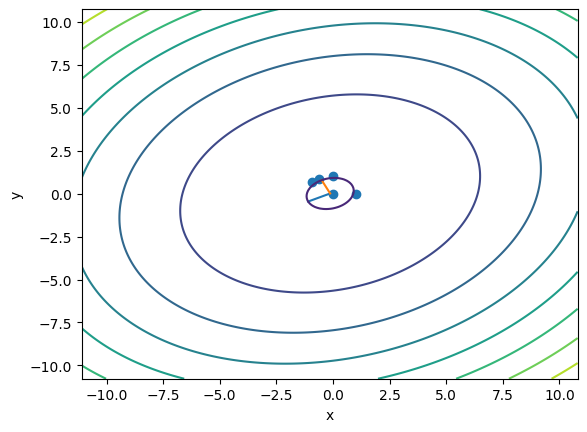

-10.55320934392724 10.993318003671178


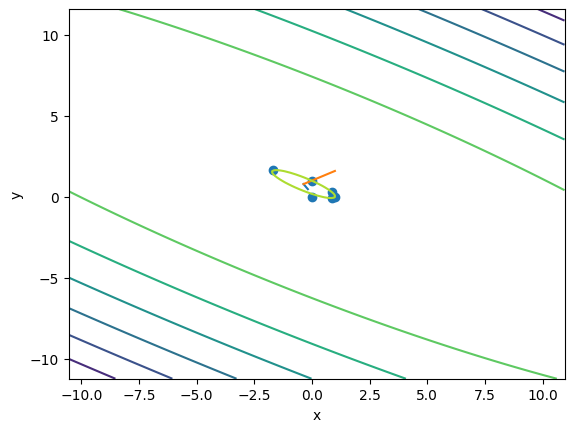

-10.189831824620349 11.15971398488339


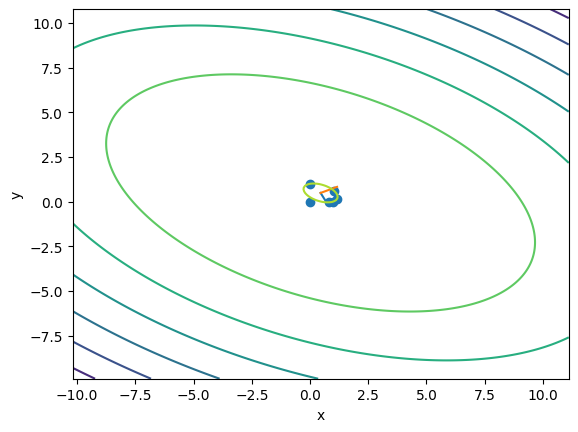

-9.738485426392648 11.7489481142969


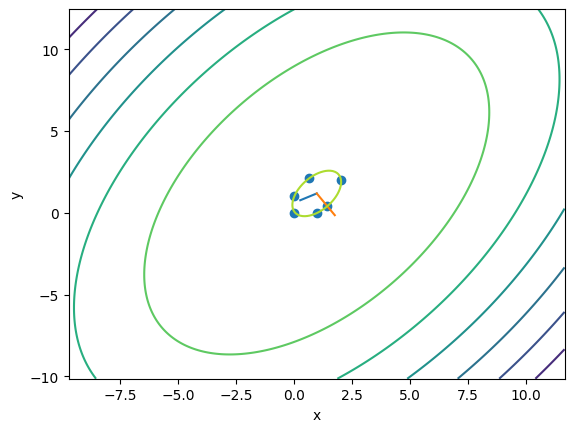

-10.39564974969337 11.520001417214726


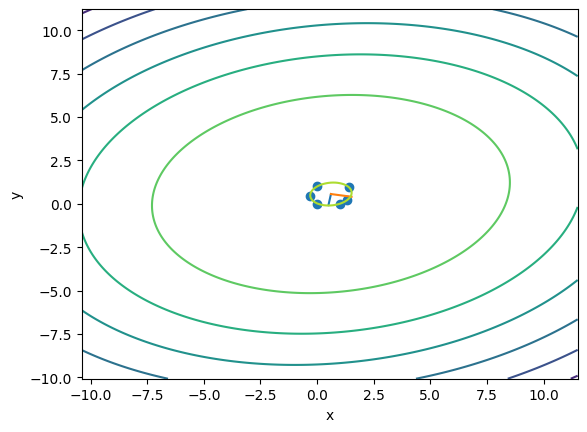

-10.422792500986027 11.022794463655211


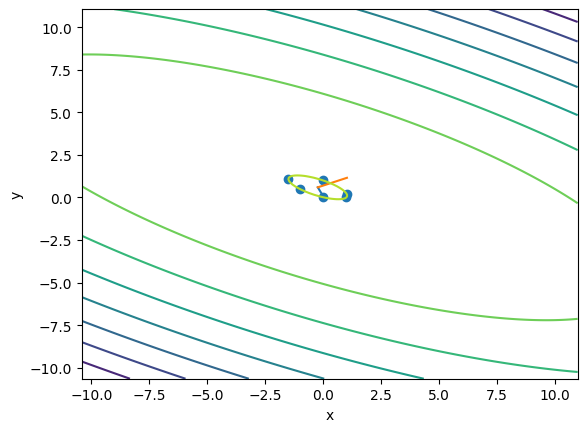

-10.569673048179624 12.5119470327381


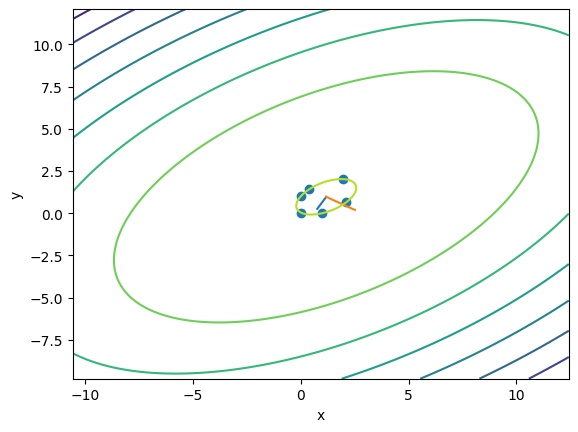

-10.804730842299072 12.165864774409984


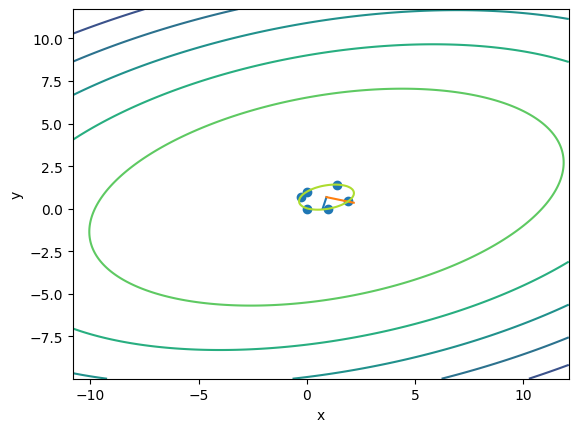

-10.513994607058752 11.475364428497835


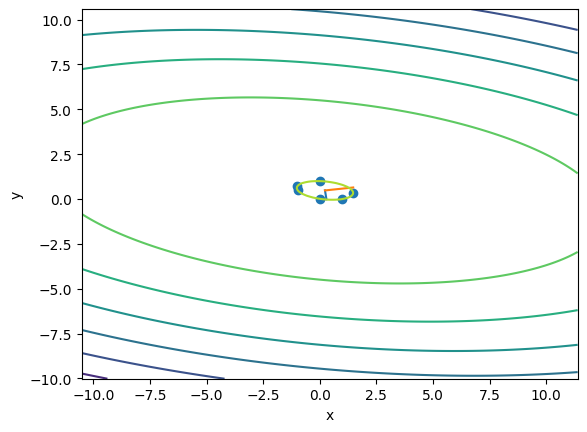

-9.980216968127417 11.341350900237977


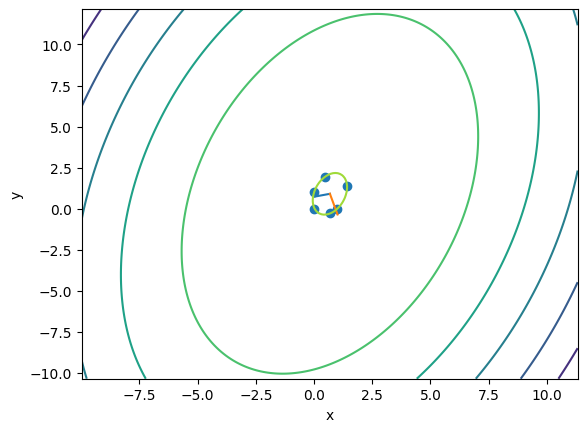

-10.160872815283469 11.105877873668327


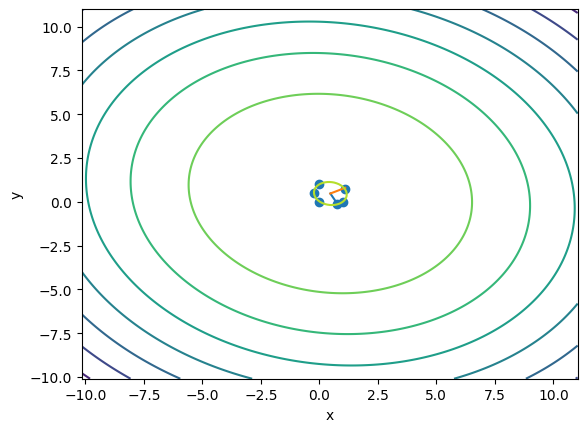

-10.467171539747056 10.997239560863886


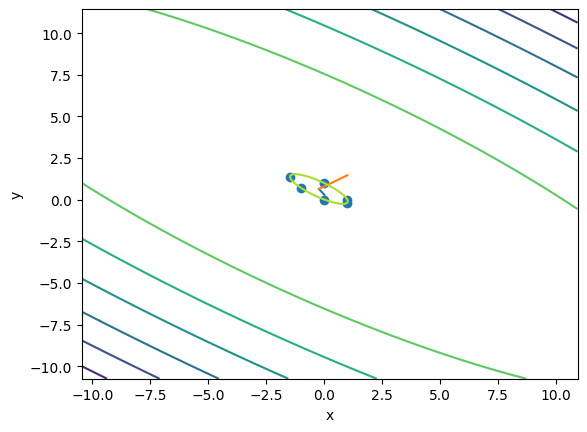

-10.080962255168258 11.205313922689594


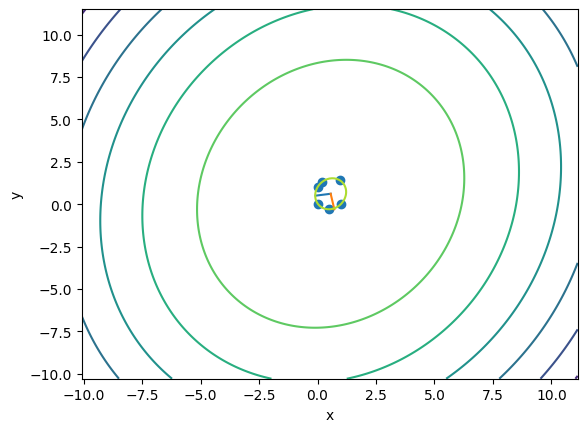

-10.100404218900398 11.04540927728519


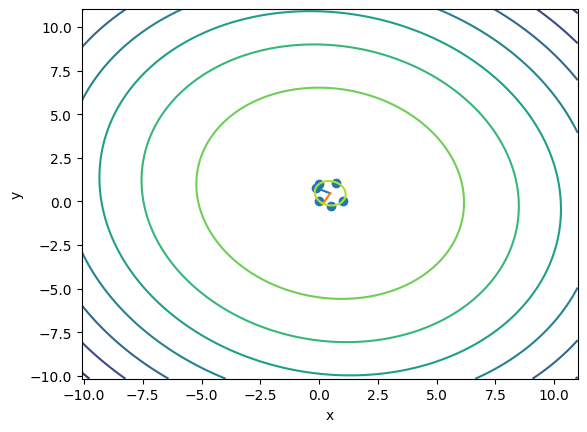

-10.103452072516362 10.96614371102326


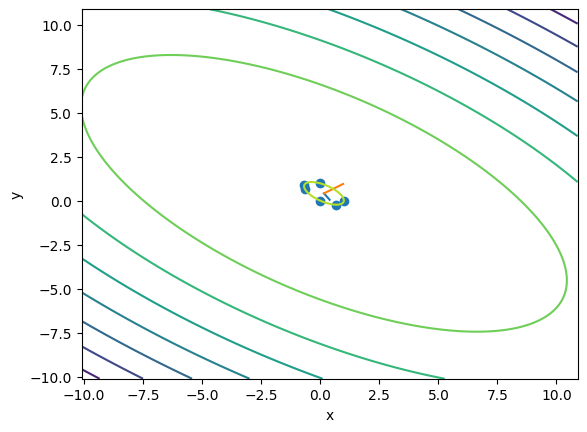

-10.828839353767298 10.42880561888882


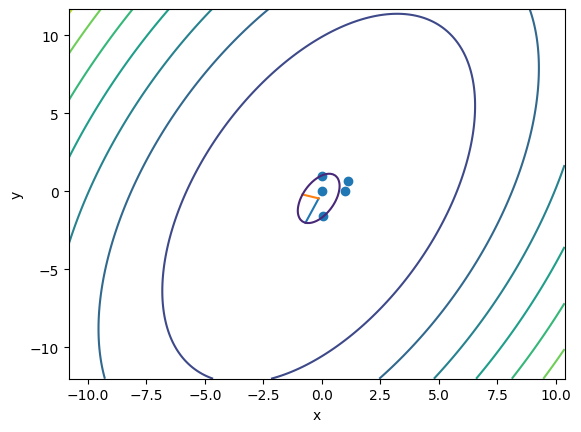

-12.381205497923101 11.510906414944776


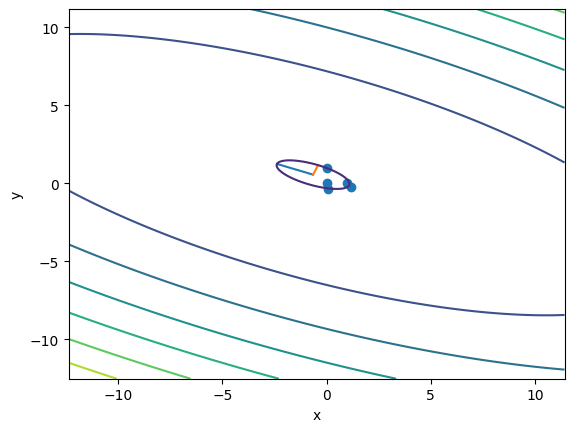

-13.764153485059001 11.85671037320979


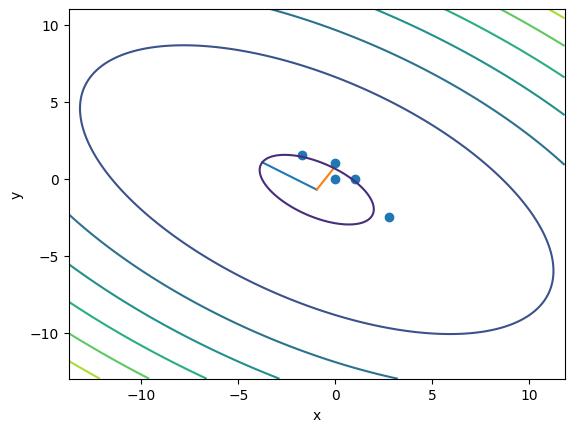

-10.717672585169355 11.109990871035853


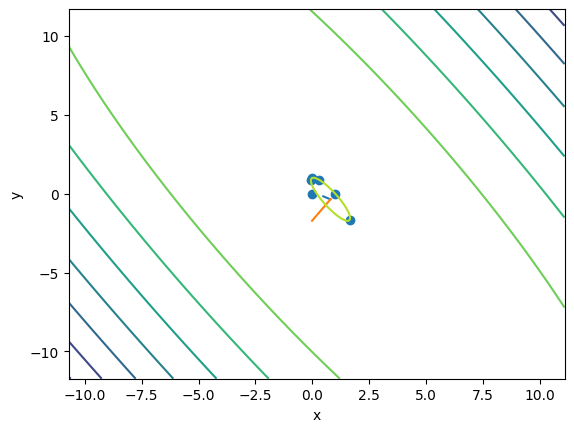

-10.227357723362207 10.69377663589535


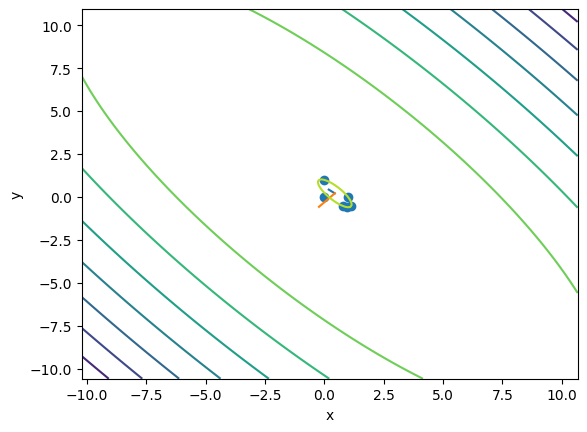

-10.504685133630003 11.020439202715625


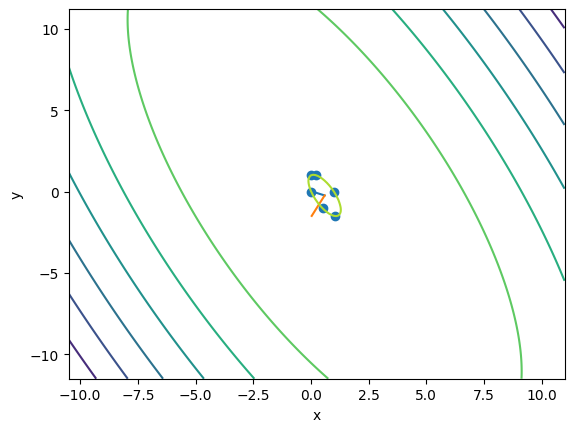

-10.013776197725864 10.975146019164775


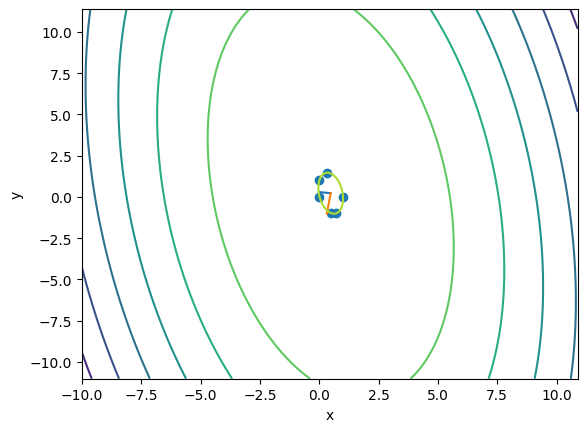

-10.277329705029084 10.995368424732701


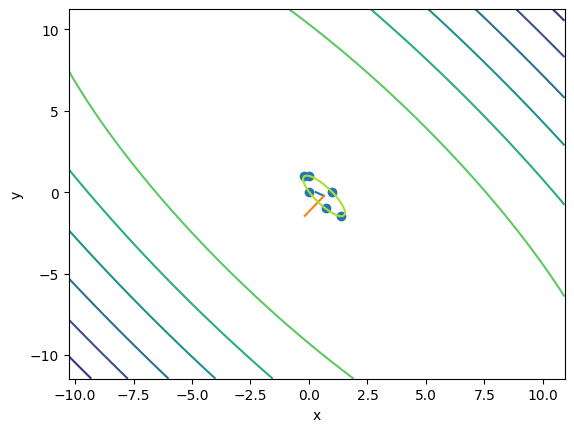

-10.101279685572926 10.797346429520763


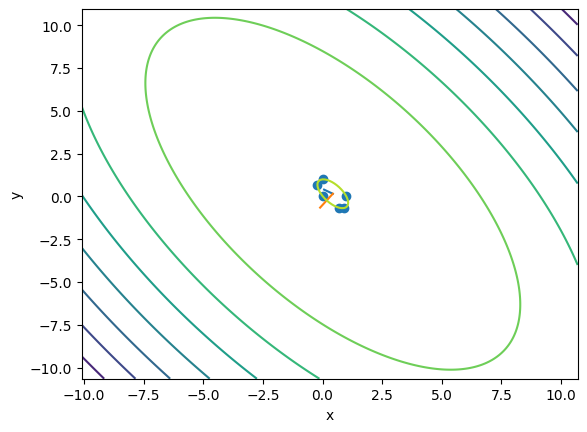

-9.898393238978318 13.049763068182099


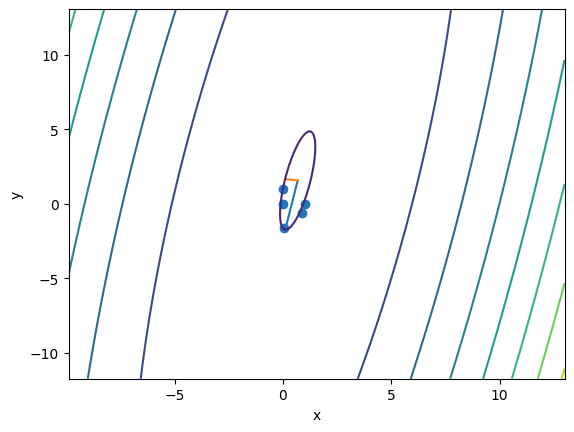

-9.998872483275171 11.56324374333029


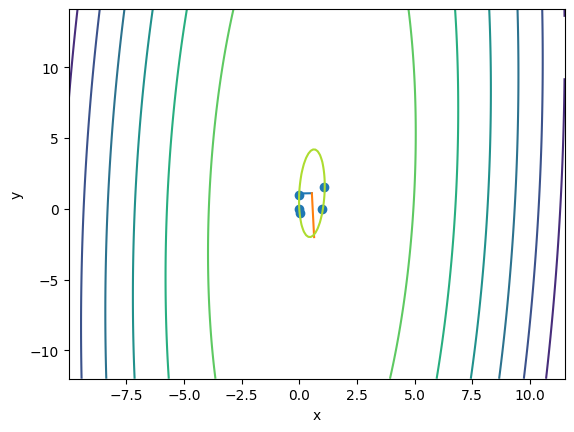

-10.7806978596837 10.420997983887172


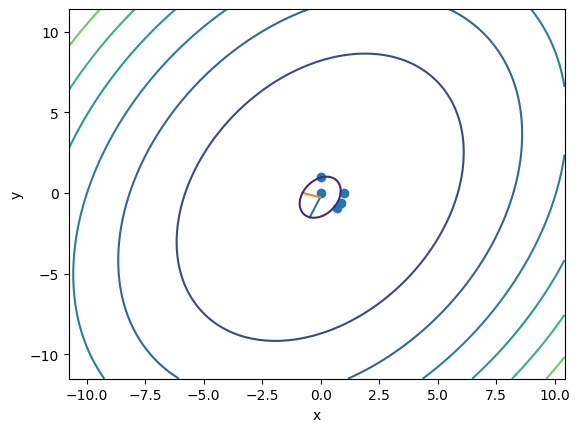

-9.920458087049125 10.89034024731143


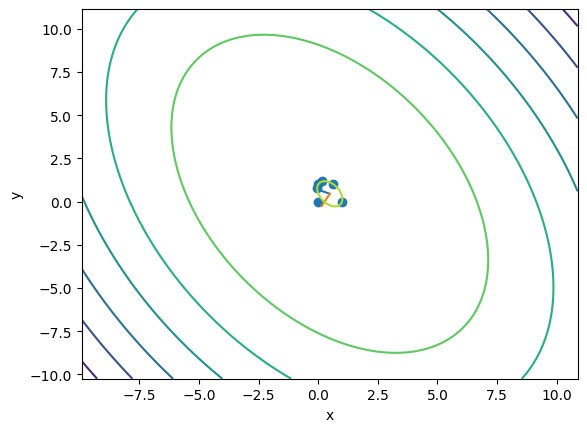

-10.122002532813696 11.001123211853834


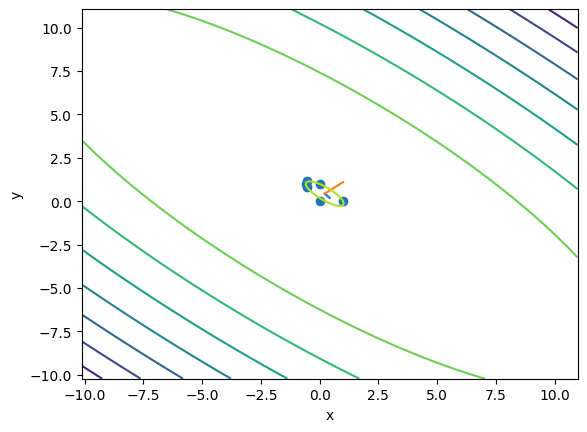

 12%|█████████████▋                                                                                                 | 7/57 [05:09<33:54, 40.69s/it]

-11.42173414672608 11.089481695462592


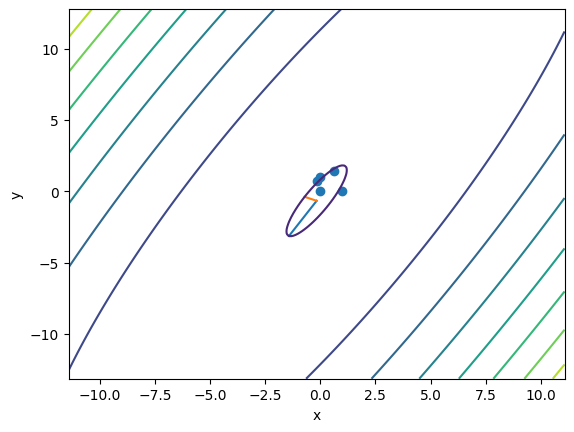

-9.685001684490352 11.36617795629708


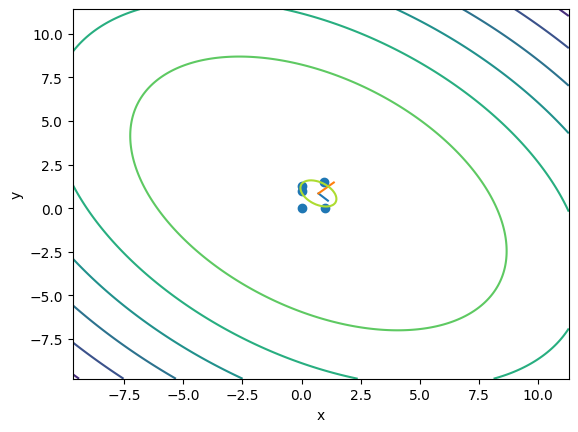

-10.727043516640428 10.646713841628518


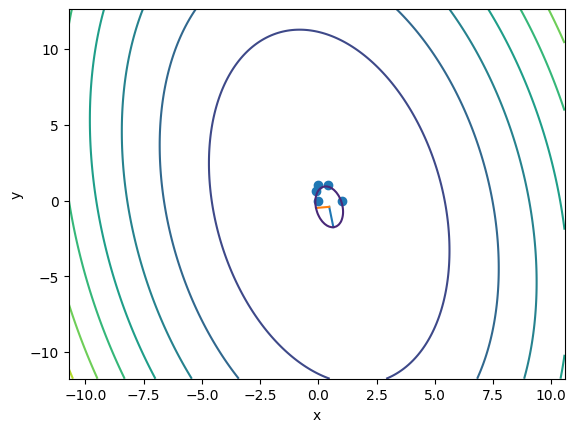

 14%|███████████████▌                                                                                               | 8/57 [05:27<27:12, 33.31s/it]

-10.018028405821852 11.508472637312119


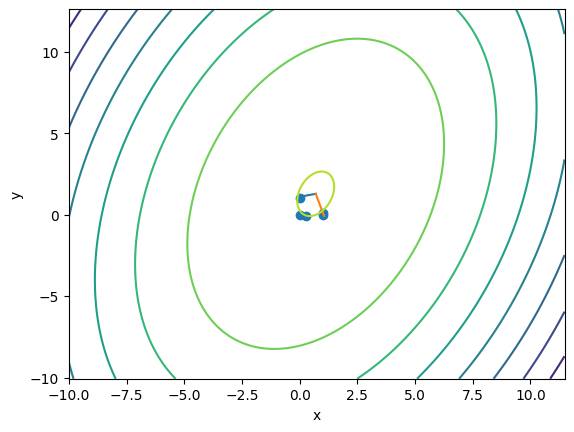

-14.218449194954012 12.167097665104023


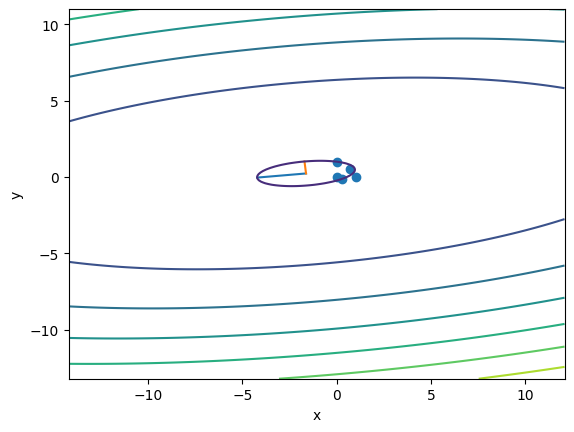

 18%|███████████████████▎                                                                                          | 10/57 [05:59<18:51, 24.07s/it]

-10.230548123176423 11.678963612189445


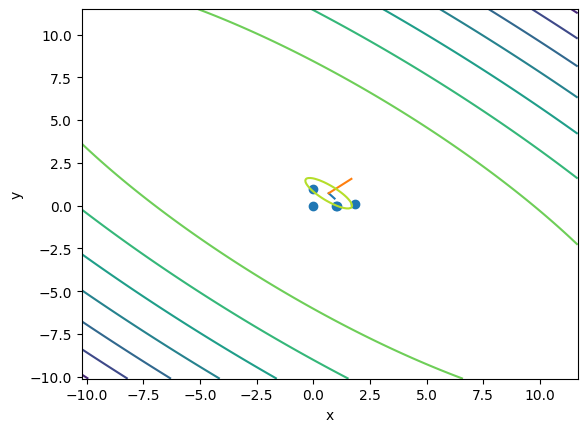

-13.121972399885127 11.366962041935677


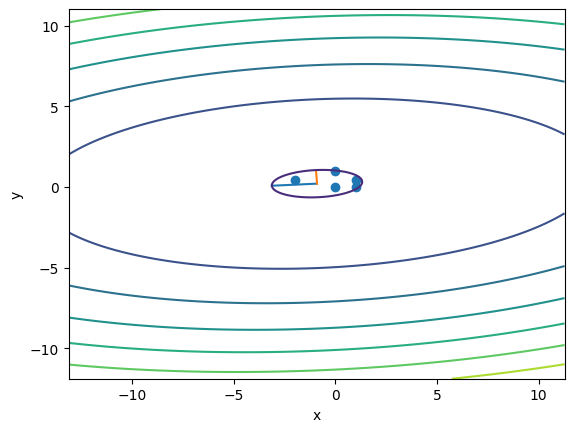

-12.147465833752111 13.145532300920426


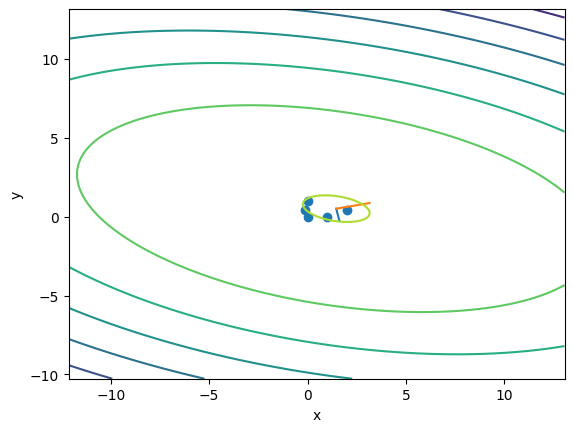

-11.918543983161502 12.31541759936356


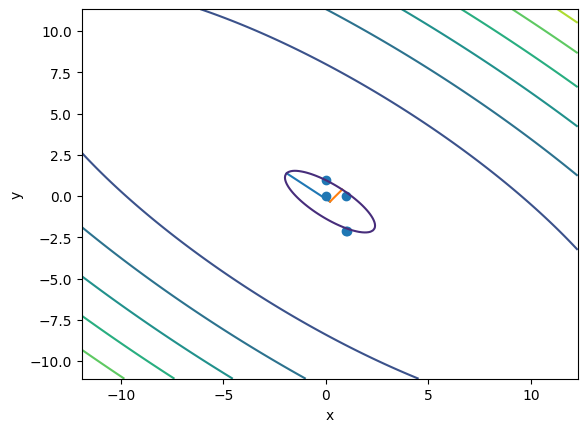

-12.369394009882669 11.15415568032797


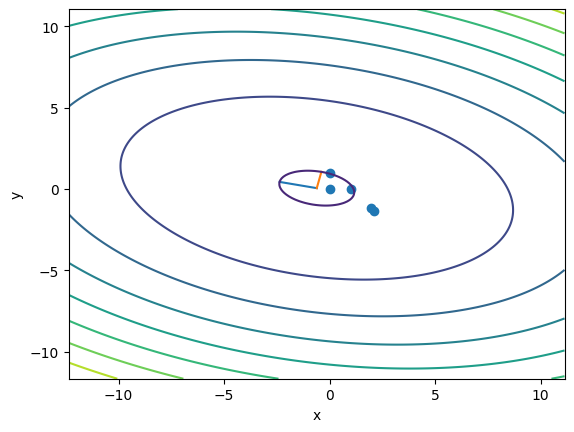

/Users/k.nosorev/projects/NSU/Farich/geometry.py:31: RuntimeWarning:

invalid value encountered in sqrt

/Users/k.nosorev/projects/NSU/Farich/geometry.py:32: RuntimeWarning:

invalid value encountered in sqrt



-17.159976254212587 10.065382489515429


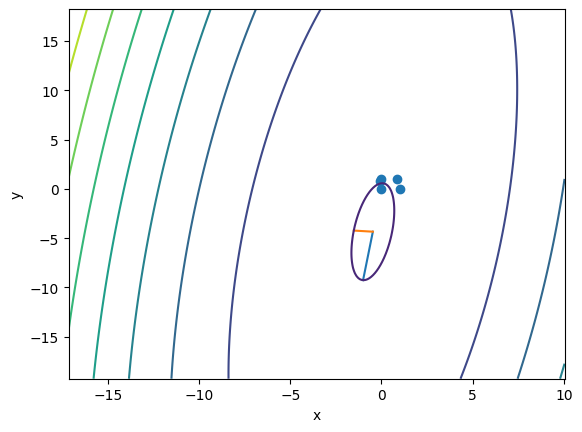

-15.127227873263324 10.163482584804267


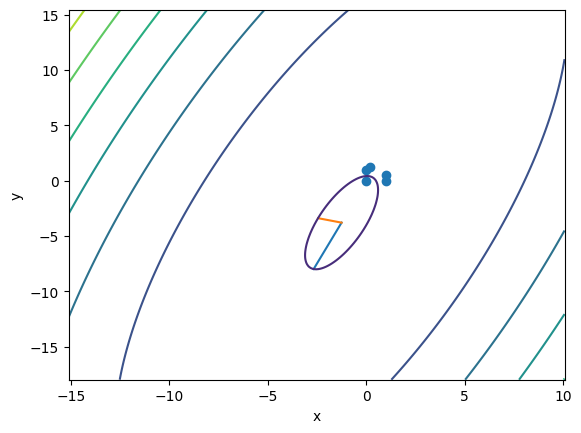

-11.677173351669484 11.113195396371195


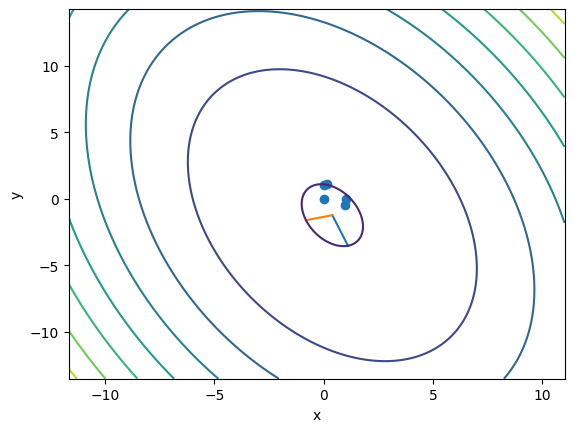

-10.944716242956485 12.130883986817057


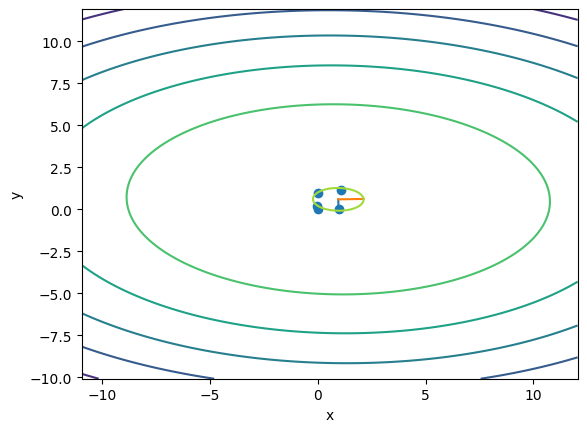

-9.954344482058193 12.981710150180371


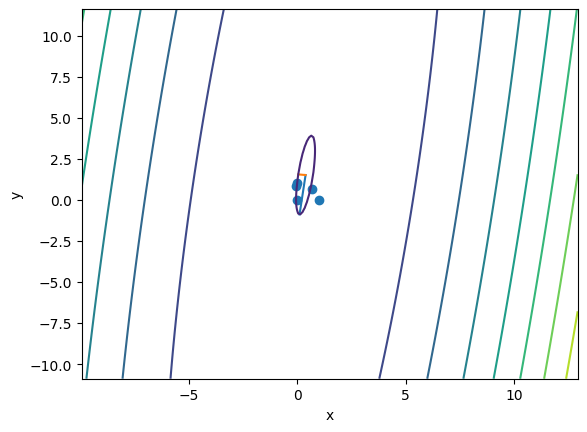

 19%|█████████████████████▏                                                                                        | 11/57 [06:17<17:00, 22.19s/it]

-12.843427129726932 12.387069615281812


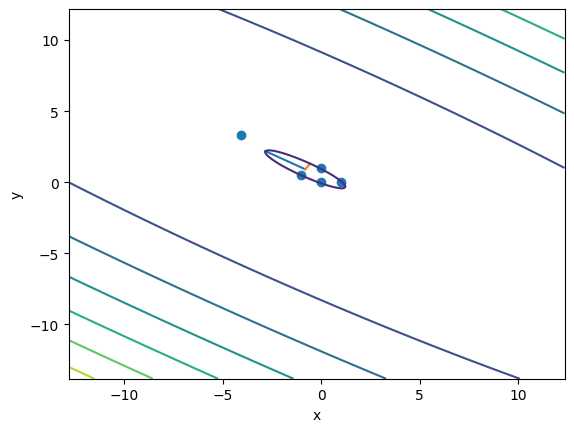

-10.523938509631328 10.937385998001226


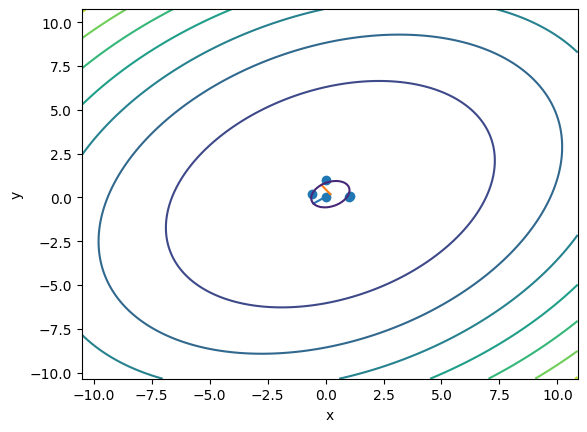

-23.371039530811075 11.00910999091272


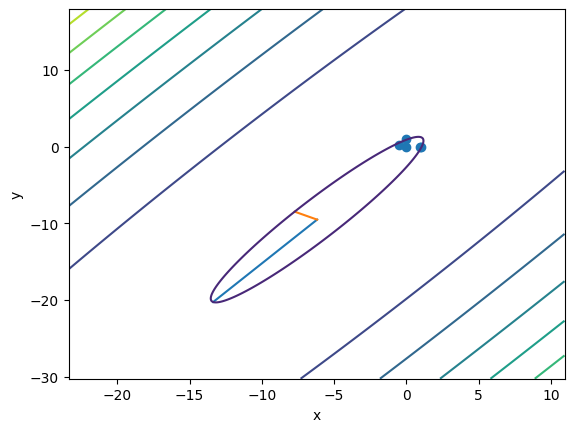

-9.862164057728606 10.93509052639517


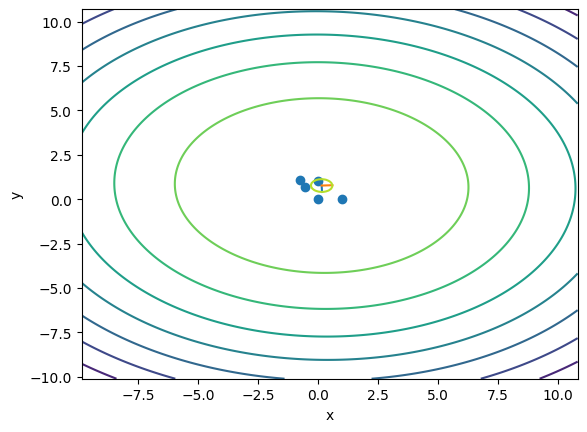

-22.023706614602865 29.288000373388265


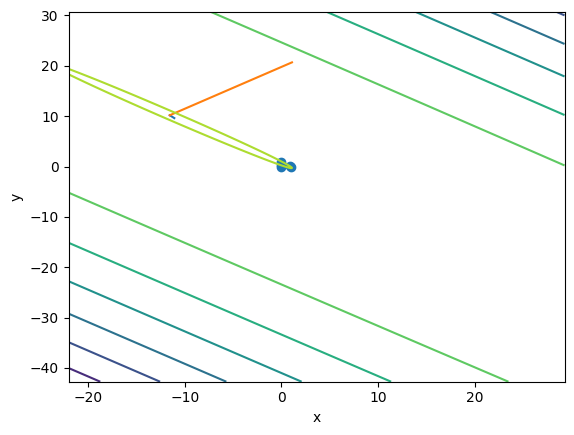

-9.993498266285505 11.269447431315191


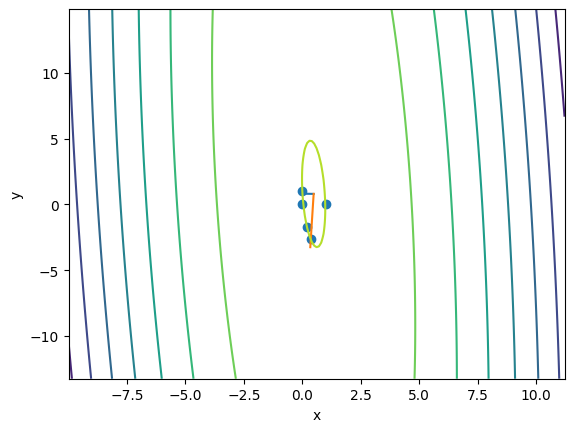

-11.323351352373056 11.04935862821118


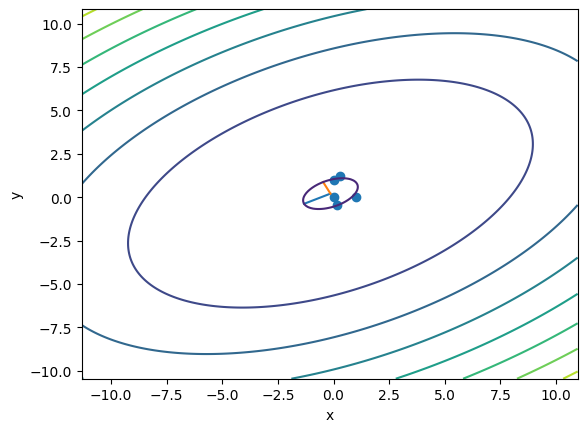

 21%|███████████████████████▏                                                                                      | 12/57 [06:35<15:53, 21.18s/it]

-19.455417222718545 11.569352437491121


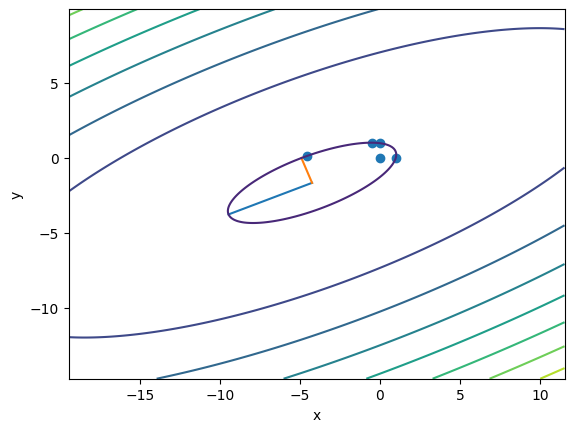

-10.024352969897501 11.512029032491615


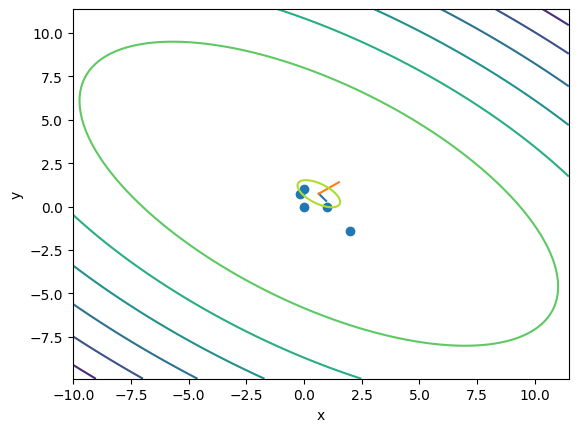

-12.402485509296556 12.196357918073504


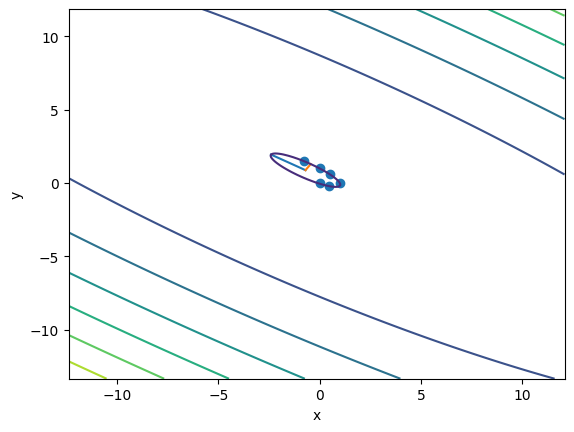

-11.47122796261418 11.201689848494187


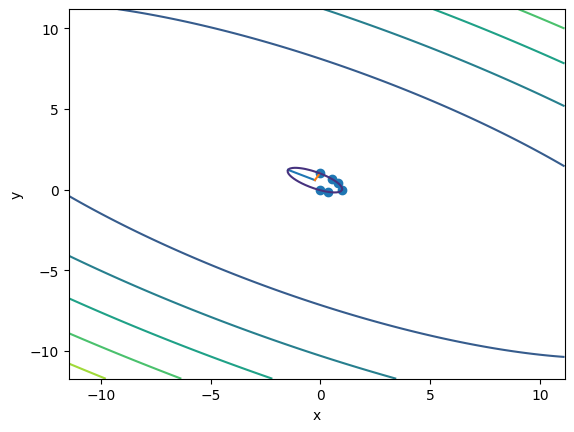

-9.918650884612413 13.099676220889846


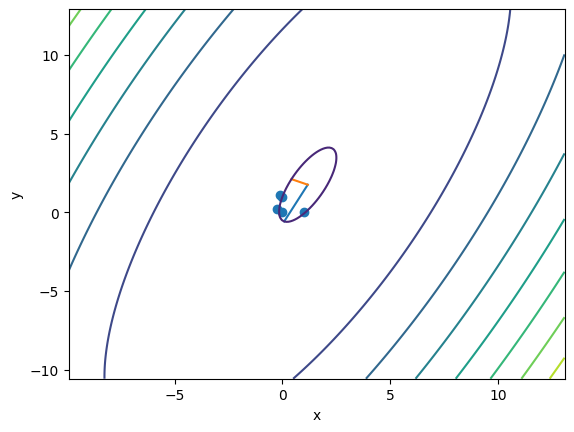

-10.234583164281167 11.533427807427572


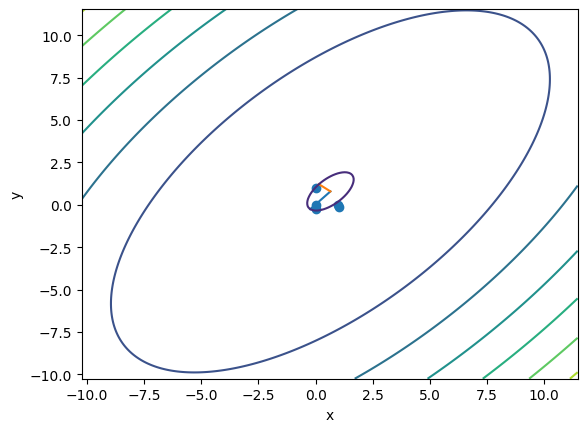

-9.222302149394146 12.646048523461225


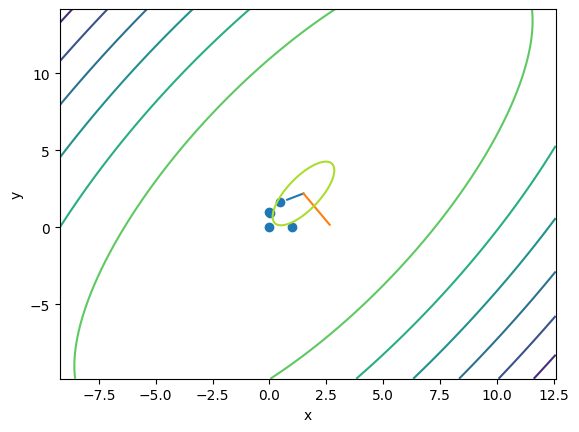

-20.968485211575903 19.031075957604294


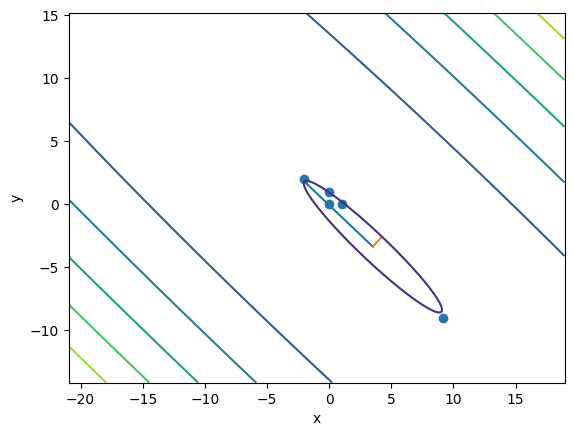

-12.113655936849439 11.062681595734078


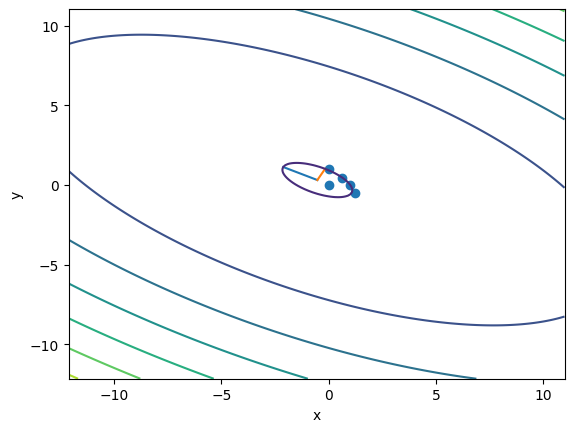

-11.860262225306386 11.943591844722771


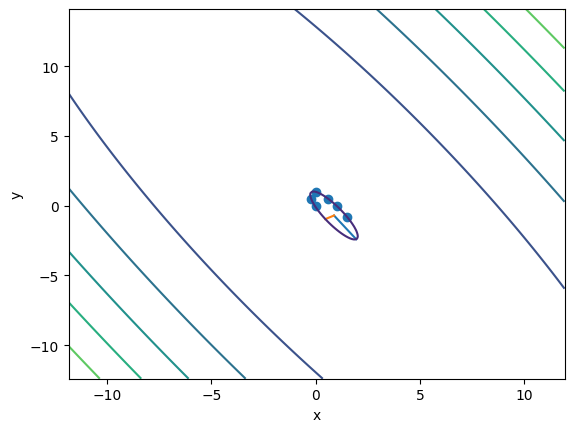

-12.866643738200995 12.01591255171082


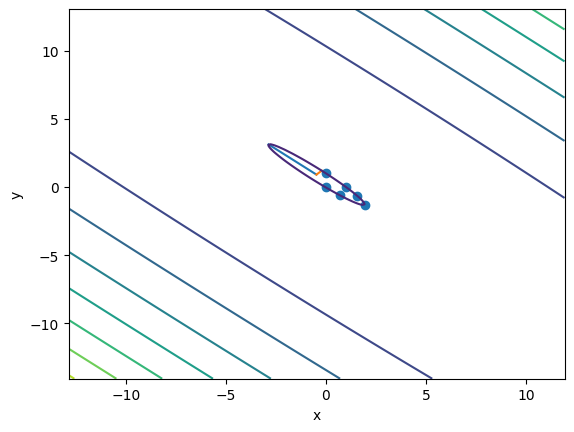

-10.257752744382723 13.124163613214494


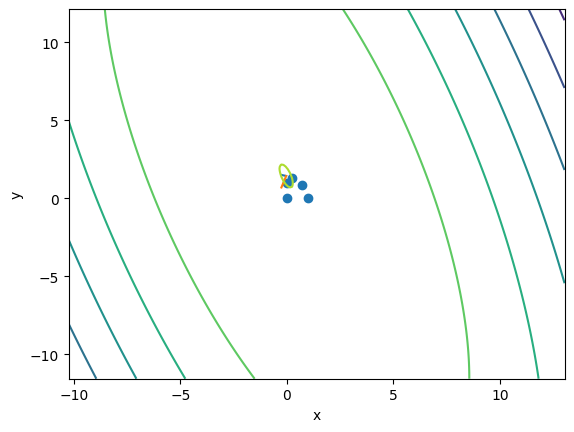

-10.068138748536608 10.73629590290881


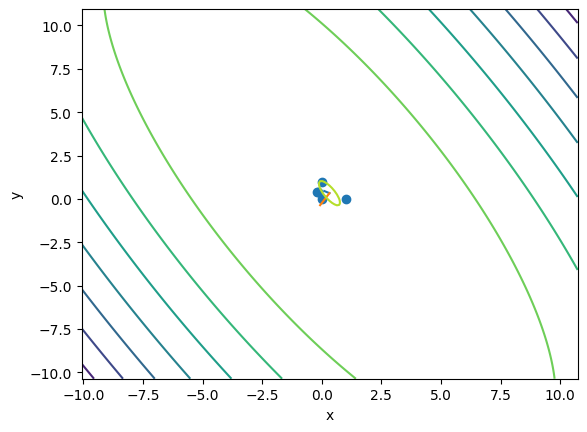

-10.469596195753583 10.27919196047798


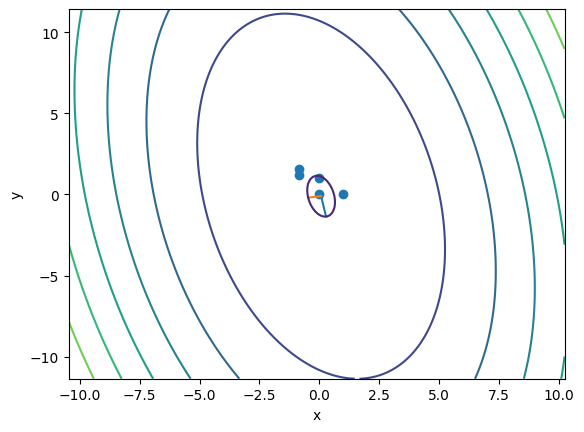

-10.653514999621732 11.227626631111184


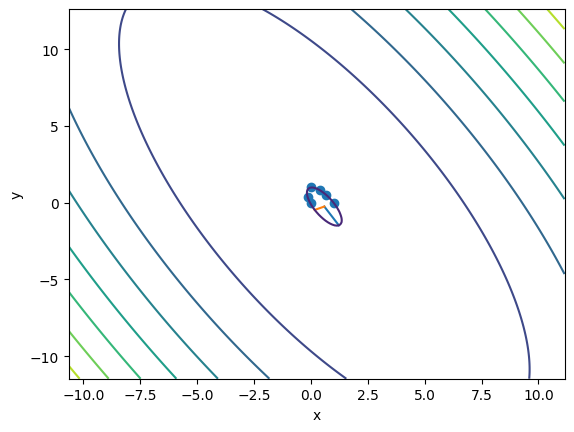

-11.560620014840756 13.11920739084809


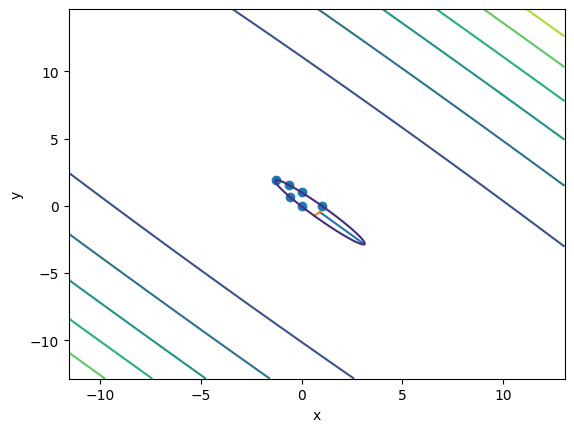

 25%|███████████████████████████                                                                                   | 14/57 [07:18<22:26, 31.30s/it]


KeyboardInterrupt: 

In [63]:
eps = 1e-4


points = df['points'].to_numpy()
centrs = []
vectors_all = []


params = []
find = False
for idx1, p1 in tqdm(enumerate(points), total = len(points)):
    if find: break
    for idx2, p2 in enumerate(points):
        if find: break
        if idx1 == idx2: continue
        for idx3, p3 in enumerate(points):
            if find: break
            if idx3  in [idx1, idx2]: continue
            try:
                plane, transf, inv_transf = get_plain_and_transform(p1, p2, p3)
            except ValueError as e:
                continue
            cur_points = []
            for idx4, p4 in enumerate(points):
                if np.abs(np.linalg.norm(plane.project_point(p4) - p4)) > eps: continue
                p4 = plane.project_point(p4)
                cur_points.append(p4)
            
            if len(cur_points) <= 4: continue
                
            x, y = get_x_y_from_points(cur_points, transf)
            try:
                centr, (A,B,C,D,E), vectors = geometry.get_elipse_from_points(x, y)
            except np.linalg.LinAlgError as e:
                continue
            except ValueError as e:
                continue
            ax = plt.subplot(1,1,1)
            ax.scatter(x, y)
            ax.set_xlabel('x')
            ax.set_ylabel('y')
            ax.plot([centr[0], vectors[0][0]], [centr[1], vectors[0][1]])
            ax.plot([centr[0], vectors[1][0]], [centr[1], vectors[1][1]])
            ax.scatter(*centr)
            
            
            v1 = vectors[0]
            neg_v1 = 2*centr[0] -(vectors[0])
            v2 = vectors[1]
            neg_v2 = 2*centr[1] -(vectors[1])
            
            
            left_x = min(v1[0], v2[0], neg_v1[0], neg_v2[0]) - 10
            right_x = max(v1[0], v2[0], neg_v1[0], neg_v2[0]) + 10
            left_y = min(v1[1], v2[1], neg_v1[1], neg_v2[1]) - 10
            right_y = max(v1[1], v2[1], neg_v1[1], neg_v2[1]) + 10
            print(left_x, right_x)
            x_el = np.arange(left_x,right_x,0.1)
            y_el = np.arange(left_y,right_y,0.1)
            X, Y = np.meshgrid(x_el,y_el)
            ax.contour(x_el, y_el, ellipse(A,B,C,D,E)(X, Y));
            
            plt.show()
            
            napr1 = Vector([*v1, 0]) - centr
            napr2 = Vector([*v2, 0]) - centr
            
            vectors_all.append((inv_transf(napr1), inv_transf(napr2)))
            centrs.append(inv_transf(centr))
                    
#             for idx4, p4 in enumerate(points):
#                 if find: break
#                 if idx4  in [idx1, idx2, idx3]: continue
#                 if np.abs(np.linalg.norm(plane.project_point(p4) - p4)) > eps: continue
#                 p4 = plane.project_point(p4)
# #                 print([idx1, idx2, idx3, idx4])
#                 for idx5, p5 in enumerate(df['points']):
#                     if find: break
#                     if idx5  in [idx1, idx2, idx3, idx4]: continue
#                     if np.abs(np.linalg.norm(plane.project_point(p5) - p5)) > eps: continue
                    
#                     p5 = plane.project_point(p5)
#                     for idx6, p6 in enumerate(df['points']):
#                         if idx6  in [idx1, idx2, idx3, idx4, idx5]: continue
#                         if np.abs(np.linalg.norm(plane.project_point(p5) - p5)) > eps: continue
#                         p6 = plane.project_point(p6)
# #                         print([idx1, idx2, idx3, idx4, idx5, idx6])
# #                         print(p1)
#                         x, y = get_x_y_from_points([p1, p2, p3, p4, p5, p6], transf)
#                         try:
#                             centr = get_a_b_from_x_y(x,y)
#                         except Exception as e:
#                             print(type(e))
#                             continue
# #                         params.append(inv_transf(centr))
                        
                        
                        
#                         for p in df['points']:
#                             p = plane.project_point(p)
                        
#                         new_points = [plane.project_point(p) for p in df['points'] ]
#                         xs, ys = get_x_y_from_points(new_points, transf)
#                         plt.scatter(xs, ys)
#                         plt.scatter(x, y)
#                         x0, y0, z0 = centr[0]
#                         a, b = centr[2]
#                         plt.scatter(x0, y0)
#                         print(a, b)
#                         points_el = [ellipse22(t, a, b) for t in np.linspace(0, 2*np.pi, 100)]
#                         x_el, y_el = [np.array(v) for v in list(zip(*points_el))]
#                         plt.scatter(x_el, y_el)
                        
#                         plt.show()
                        


In [12]:
def unpack_points(points):
    xs = []
    ys = []
    zs = []
    for p in points:
        xs.append(p[0])
        ys.append(p[1])
        zs.append(p[2])
    return np.array(xs), np.array(ys), np.array(zs)

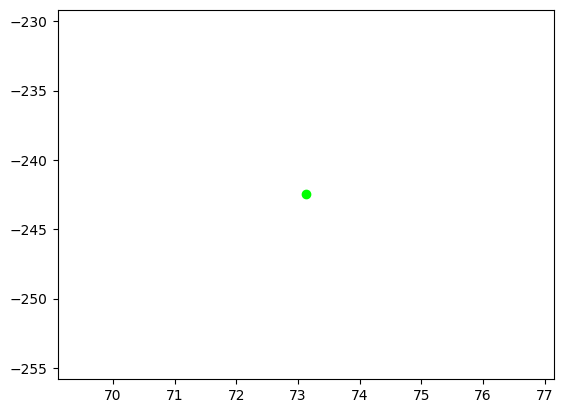

In [15]:
# df.plot.scatter("x_c", "y_c")
p = figure()
p.scatter(df["x_c"], df["y_c"])

xs, ys, _ = unpack_points(centrs)

p.scatter(xs,ys, fill_color="red")

# seaborn.scatterplot([xs, ys], color="#f00")

plt.scatter(np.median(xs), np.median(ys), color="#0f0")
show(p)

In [18]:
xs_ser = pd.Series(xs, name='x_centr')
ys_ser = pd.Series(ys, name='y_centr')

In [19]:
centrs_df = pd.concat([xs_ser, ys_ser], axis=1)

In [20]:
centrs_df

,x_centr,y_centr
0,4894.743725,-3552.851188
1,84.653760,-231.812816
2,3.553785,-172.461340
3,-8.154854,-386.900283
4,71.043095,-240.046798
...,...,...
616,1112.391524,-352.257117
617,-236.434204,-863.006795
618,254.473123,-252.371863
619,68.504998,-230.632409


In [21]:
centrs_df['x_centr_round'] = centrs_df['x_centr'].round(4)
centrs_df['y_centr_round'] = centrs_df['y_centr'].round(4)

In [22]:
most_common_centr = {}
for idx, r in centrs_df.iterrows():
    cent = (r.x_centr_round, r.y_centr_round) 
    if cent not in most_common_centr:
        most_common_centr[cent] = 0
    most_common_centr[cent] += 1

In [23]:
x_c, y_c = max(most_common_centr, key=lambda x: most_common_centr[x])

In [24]:
centrs_df[centrs_df.x_centr >= -1e4]

,x_centr,y_centr,x_centr_round,y_centr_round
0,4894.743725,-3552.851188,4894.7437,-3552.8512
1,84.653760,-231.812816,84.6538,-231.8128
2,3.553785,-172.461340,3.5538,-172.4613
3,-8.154854,-386.900283,-8.1549,-386.9003
4,71.043095,-240.046798,71.0431,-240.0468
...,...,...,...,...
616,1112.391524,-352.257117,1112.3915,-352.2571
617,-236.434204,-863.006795,-236.4342,-863.0068
618,254.473123,-252.371863,254.4731,-252.3719
619,68.504998,-230.632409,68.5050,-230.6324


In [65]:
centrs_df

,x_centr,y_centr,x_centr_round,y_centr_round
0,4894.743725,-3552.851188,4894.7437,-3552.8512
1,84.653760,-231.812816,84.6538,-231.8128
2,3.553785,-172.461340,3.5538,-172.4613
3,-8.154854,-386.900283,-8.1549,-386.9003
4,71.043095,-240.046798,71.0431,-240.0468
...,...,...,...,...
616,1112.391524,-352.257117,1112.3915,-352.2571
617,-236.434204,-863.006795,-236.4342,-863.0068
618,254.473123,-252.371863,254.4731,-252.3719
619,68.504998,-230.632409,68.5050,-230.6324


In [73]:
# df.plot.scatter("x_c", "y_c")
p = figure()
p.scatter(df["x_c"], df["y_c"], color="red")
p.scatter(centrs_df[centrs_df.x_centr >= -1e4]["x_centr"], centrs_df[centrs_df.x_centr >= -1e4]["y_centr"], color="green")
p.scatter(centrs_df["x_centr"].median(), centrs_df["y_centr"].median(), color="purple")
# p.scatter(x_c, y_c, color="yellow")
show(p)

DeprecationWarning: The `source` parameter emit a  deprecation warning since IPython 8.0, it had no effects for a long time and will  be removed in future versions.